In [1]:
# Imports
import os 
from string import ascii_lowercase as alc
from itertools import count

# Data processing
import xarray as xr
import numpy as np
from scipy import stats
import scipy.signal
from pathlib import Path

# Matplotlib
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import TwoSlopeNorm, LinearSegmentedColormap, ListedColormap, Normalize
from matplotlib.ticker import AutoMinorLocator, FuncFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.patheffects as PathEffects
from matplotlib.cm import ScalarMappable
from matplotlib.collections import LineCollection
from shapely.geometry import box, Point, Polygon

# Cartopy
import cartopy.crs as ccrs

# Colour maps
import cmcrameri.cm as SCM

# Util
import ROME2024_cd_mechanism_util as util

# Simulated millennial-scale climate variability driven by a convection-advection oscillator - Supplementary Information

This notebook presents the code that was used to create supplementary figures S1 to S16 and S18.
You can save the Figures by uncommenting the cells at the end of each section.


## Global variables

In [2]:
# Define the script and output folders

script_folder = os.getcwd()
data_folder = f"{script_folder}/data"
output_folder = f"{script_folder}/Figures"


In [3]:
color_expts = {'xoupa':'black', 
              'xouph':'xkcd:bluey grey', 
              'xoupf':'xkcd:velvet', 
              'xoupk':'xkcd:bluish', 'tfgbi':'xkcd:bluish',
               'xppbe':'xkcd:purple',
               'xppbf':'xkcd:bluish green',
               'tfgbj':'xkcd:light orange'
}

label_expts = {'xoupa':'CTRL', 
               'xouph':'21k', 
               'tfgbi':'20.7k', 
               'xoupk':'20.7k_tdc', 
               'xoupf':'18.2k',
               'xppbe':'20.7k with 21k GST',
               'xppbf':'20.7k_no_gst'}


In [4]:
color_zones = {'arc':'#A4D4D2',
               'na':'#00316A', 'ena':'xkcd:blue green', 'wna':'xkcd:navy', 
               'tpa':'#306B34', 
               'sa':'#CCB400', 
               'pac':'#B41001', 'npc':'xkcd:light red', 'spc':'xkcd:dark red',
               'idn':'#F68307', 
               'soa':'xkcd:wisteria', 'soi':'xkcd:pinky purple', 'sop':'xkcd:royal purple', 
               'so':'#953878', 
               'tot':'xkcd:black', 
               'gin':'#DFBA47', 'irm':'#CFABA0', 'ls':'#CC573D', 
               'spg':'#C4BE81', 'eur':'#9EA550'}

label_zones = {'arc':'Arctic', 
               'ena':'East North Atlantic', 'wna':'West North Atlantic', 
               'na': 'North Atlantic', 'tpa':'Subtropical Atlantic', 'sa':'South Atlantic',
               'pac':'Pacific', 'npc':'North Pacific', 'spc':'South Pacific',
               'idn':'Indian',
               'so':'Southern', 'soa':'SO Atlantic', 'soi':'SO Indian', 'sop':'SO Pacific', 
               'tot':'Total',
               'gin':'GIN Seas', 'irm':'Irminger Sea', 'ls':'Labrador Sea', 
               'spg':'Subpolar gyre', 'eur':'Iceland Basin'}


In [5]:
color_spans = {'cold':'#484A6C', 
               'warming':'#FFABAB',
               'merid':'#C9381B', 
               'zonal':'#F59F00', 
               'cooling':'#B7DDF6'}


In [6]:
marker_depth = {'sfc':'^', 'int':'+', 'deep':'v'}
depth_label = {'sfc':'Upper\n0-550m', 'int':'Intermediate\n550-1800m', 'deep':'Deep\n1800-5500m'}
label_depth_short = {'sfc':'Upper', 'int':'Intermediate', 'deep':'Deep'}

color_text = {'arc':'#66B7B4',
               'na':'#00316A', 'ena':'xkcd:blue green', 'wna':'xkcd:navy', 
               'tpa':'#306B34', 
               'sa':'#CCB400', 
               'pac':'#B41001', 'npc':'xkcd:light red', 'spc':'xkcd:dark red',
               'idn':'#F68307', 
               'soa':'xkcd:wisteria', 'soi':'xkcd:pinky purple', 'sop':'xkcd:royal purple', 
               'so':'#953878', 
               'tot':'xkcd:black'}


In [7]:
tendencies = ['advx', 'advy', 'advz', 'adv', 'diffx', 'diffy', 'diffz', 'diff',
              'conv', 'fourier', 'med', 'gm', 'ml', 'robert', 'sfc', 'ice']

colors_tdc = {'adv':'#DBB40C','diff':'#901402',
              'sfc':'#032345','med':'#6DB025','ice':'#35C9CC', 'ml':'xkcd:lilac', 'conv':'xkcd:dark orange',
              'tot':'xkcd:grey'}
label_tdc = {'adv':'Advection', 'advxy':'Advection (horizontal)', 'advz':'Advection (vertical)',
             'diff':'Diffusion', 'diffxy':'Diffusion (horizontal)', 'diffz':'Diffusion (vertical)',
             'sfc':'Surface','med':'Mediterranean','ice':'Ice',
             'ml':'Mixed Layer', 'conv':'Convection',
             'tot':'Total'}


In [8]:
filt = util.ButterLowPass(order=1, fc=2*10**-3, fs=1, mult=2)

## Data

### Zones

In [9]:
ds_basin = xr.open_dataset(f"{data_folder}/inputs/basin_hadcm3_glac1d_lgm.nc")

masks = {}

masks['arc'] = ds_basin.arctic
masks['na'] = ds_basin.atlantic.sel(latitude=slice(44,79))
masks['tpa'] = ds_basin.atlantic.sel(latitude=slice(-33,44))
masks['sa'] = ds_basin.atlantic.sel(latitude=slice(-60,-33))
masks['pac'] = ds_basin.pacific
masks['so'] = ds_basin.southern
masks['idn'] = ds_basin.indian


In [10]:
masks_na = {}

masks_na['gin'] = xr.concat([ds_basin.atlantic.sel(longitude=slice(340,360)).sel(latitude=slice(64,79)),
                          ds_basin.atlantic.sel(longitude=slice(0,20)).sel(latitude=slice(64,79))], 
                         dim='longitude')
masks_na['eur'] = xr.concat([ds_basin.atlantic.sel(longitude=slice(340,360)).sel(latitude=slice(44,64)),
                          ds_basin.atlantic.sel(longitude=slice(0,2)).sel(latitude=slice(44,64))], 
                         dim='longitude')
masks_na['irm'] = ds_basin.atlantic.sel(longitude=slice(316,339)).sel(latitude=slice(53,70))
masks_na['ls'] = ds_basin.atlantic.sel(longitude=slice(280,315)).sel(latitude=slice(53,79))
masks_na['spg'] = ds_basin.atlantic.sel(longitude=slice(280,339)).sel(latitude=slice(44,53))
masks_na['arc'] = ds_basin.arctic


In [11]:
masks_na_atm = {}

masks_na_atm['gin'] = masks_na['gin'].sel(
    longitude=masks_na['gin'].longitude[1::3]).assign_coords(
    latitude=masks_na['gin'].latitude+0.625).sel(
    latitude=masks_na['gin'].latitude[::2]+0.625)

masks_na_atm['irm'] = masks_na['irm'].sel(
    longitude=masks_na['irm'].longitude[2::3]).assign_coords(
    latitude=masks_na['irm'].latitude+0.625).sel(
    latitude=masks_na['irm'].latitude[1::2]+0.625)

masks_na_atm['eur'] = masks_na['eur'].sel(
    longitude=masks_na['eur'].longitude[1::3]).assign_coords(
    latitude=masks_na['eur'].latitude+0.625).sel(
    latitude=masks_na['eur'].latitude[::2]+0.625)

masks_na_atm['ls'] = masks_na['ls'].sel(
    longitude=masks_na['ls'].longitude[1::3]).assign_coords(
    latitude=masks_na['ls'].latitude+0.625).sel(
    latitude=masks_na['ls'].latitude[1::3]+0.625)

masks_na_atm['arc'] = masks_na['arc'].sel(
    longitude=masks_na['arc'].longitude[0::3]).assign_coords(
    latitude=masks_na['arc'].latitude+0.625).sel(
    latitude=masks_na['arc'].latitude[1::2]+0.625)

In [12]:
depths = {'sfc':(5,667), 'int':(667,2000), 'deep':(2000,6000), 'tot':(None,None)}

### Spans

In [13]:
span_regions = {}

span_regions['tfgbi']={'cold':Polygon([(18,30), (27,30), (27,40), (18,40)]), 
                       'merid':Polygon([(70,50), (95,50), (95,90), (75,90), (55,65)]), 
                       'zonal':Polygon([(30,65), (55,65), (75,90), (55,105), (30,105)]),
                       'warming':Polygon([(18,40), (27,40), (70,50), (55,65)]), 
                       'cooling':Polygon([(18,40), (27,40), (55,65), (30,65)])}

span_regions['xppbf']={'cold':Polygon([(18,30), (27,30), (27,40), (18,40)]), 
                       'merid':Polygon([(70,50), (100,50), (100,90), (75,90), (55,65)]), 
                       'zonal':Polygon([(30,65), (55,65), (75,90), (55,105), (30,105)]),
                       'warming':Polygon([(18,40), (27,40), (70,50), (55,65)]), 
                       'cooling':Polygon([(18,40), (27,40), (55,65), (30,65)])}

span_regions['xoupk']={'cold':Polygon([(18,30), (27,30), (27,40), (18,40)]), 
                       'merid':Polygon([(70,50), (100,50), (100,90), (75,90), (55,60)]), 
                       'zonal':Polygon([(30,65), (55,60), (75,90), (55,105), (30,105)]),
                       'warming':Polygon([(18,40), (27,40), (70,50), (55,60)]), 
                       'cooling':Polygon([(18,40), (27,40), (55,60), (30,65)])}

span_regions['xouph']={'cold':box(35,40,45,55), 
                       'warming':box(35,55,52,67), 
                       'merid':box(0,0,0,0), 
                       'zonal':box(35,67,52,95),
                       'cooling':box(35,55,52,67)}

span_regions['xoupf']={'cold':box(10,25,25,55), 
                       'warming':box(25,30,45,55), 
                       'merid':box(45,30,95,55), 
                       'zonal':box(0,0,0,0), 
                       'cooling':box(25,30,45,55)}


In [14]:
span_conditions, spans = {}, {}

for expt in ['tfgbi', 'xoupf', 'xouph', 'xoupk', 'xppbf']:
    span_conditions[expt], spans[expt] = {}, {}

    for phase in ['cold', 'warming', 'merid', 'zonal', 'cooling']:
        span_conditions[expt][phase] = np.genfromtxt(f"{data_folder}/{expt}/spans/{expt}.span_conditions.{phase}.csv", delimiter=',')
        
        spans[expt][phase] = np.atleast_2d(
            np.genfromtxt(f"{data_folder}/{expt}/spans/{expt}.spans.{phase}.csv", delimiter=','))

### Discharge and Ancils

In [15]:
ds_lsm = xr.open_dataset(f"{data_folder}/inputs/temev.qrparm.omask.nc")
lsm = ds_lsm.lsm

ds_discharge = xr.open_dataset(f"{data_folder}/inputs/xoup.wfix.glac_ts.nc",decode_times=False)
ds_discharge.attrs['waterfix'] = 'GLAC-1D'

ds_wfix = xr.open_dataset(f"{data_folder}/inputs/qrparm.waterfix.hadcm3.nc")


## Figure S1 - Zone definitions

Text(0.02, 0.93, 'b')

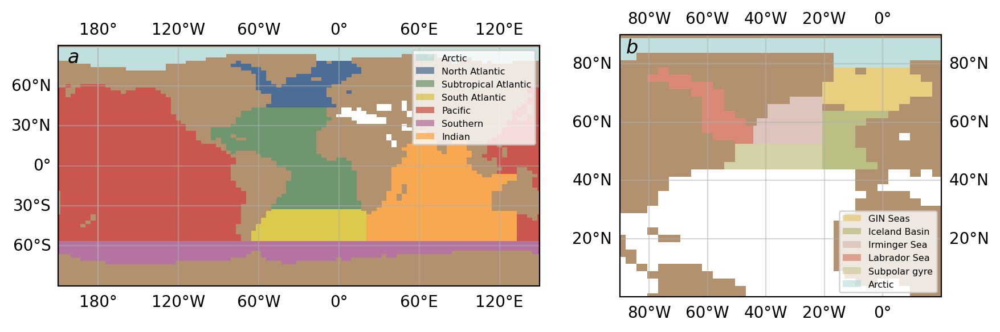

In [16]:
projection_map = ccrs.PlateCarree(central_longitude=-30.0)
fig, (axGl, axNA) = plt.subplots(nrows=1, ncols=2, subplot_kw={'projection':projection_map}, 
                                 figsize=(10,3), width_ratios=[3,2], dpi=200)

# Drawing zones
for zone in masks.keys():
    axGl.pcolormesh(masks[zone].longitude, masks[zone].latitude, masks[zone],
                  cmap=ListedColormap([color_zones[zone]]), transform=ccrs.PlateCarree(), 
                  zorder=0, alpha=0.7)

    axGl.fill([],[],
            color=color_zones[zone], alpha=0.5, fill=True,
            label=label_zones[zone], zorder=0, linewidth=0)

for zone in masks_na.keys():
    axNA.pcolormesh(masks_na[zone].longitude, masks_na[zone].latitude, masks_na[zone],
                  cmap=ListedColormap([color_zones[zone]]), transform=ccrs.PlateCarree(), 
                  zorder=0, alpha=0.7)

    axNA.fill([],[],
            color=color_zones[zone], alpha=0.5, fill=True,
            label=label_zones[zone], zorder=0, linewidth=0)


for ax in (axGl, axNA):
    
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, alpha=0.5, linestyle='-')

    ax.pcolormesh(lsm.longitude, lsm.latitude,xr.where(lsm==0, np.nan,lsm),
                  cmap=ListedColormap(['xkcd:pale brown']), transform=ccrs.PlateCarree(),
                  zorder=1)
        
axGl.legend(fontsize='xx-small', loc='upper right')

axNA.legend(fontsize='xx-small', loc='lower right')
axNA.set_extent([270,380,0,90])

axGl.annotate('a', xy=(0.02,0.93), xycoords='axes fraction',
                         size=12, style='italic')
axNA.annotate('b', xy=(0.02,0.93), xycoords='axes fraction',
                         size=12, style='italic')



In [17]:
# fig.savefig(f"{output_folder}/si/zones.png", format='png')
# fig.savefig(f"{output_folder}/si/zones.pdf", format='pdf')

## Figure S2 - Anatomy of the simulations expanded

In [18]:
amoc_ts = {}
amocf_ts = {}

for expt in ['tfgbi', 'xoupk', 'xoupf', 'xouph', 'xppbf']:
    ts = xr.open_dataset(f"{data_folder}/{expt}/{expt}.merid.annual.nc")
    amoc_ts[expt] = ts.Merid_Atlantic.sel(latitude=26.5, method='nearest').max('depth').sortby('t')
    amocf_ts[expt] = filt.process(amoc_ts[expt].values)
    

In [19]:
mld_zone, mldf_zone = {}, {}

for expt in ['tfgbi', 'xoupk', 'xoupf', 'xouph', 'xppbf']:
    mld_zone[expt], mldf_zone[expt] = {}, {}
    temp_mld = xr.open_dataset(f"{data_folder}/{expt}/na_variables/{expt}.mld.zone_na.annual.nc").mld
    
    for zone in masks_na.keys():
        mld_zone[expt][zone] = temp_mld.sel(zone=zone)[1:]
        mldf_zone[expt][zone] = filt.process(mld_zone[expt][zone].values)

In [20]:
fluxes = util.create_discharge_ts(util.remove_waterfix(util.ancil_to_discharge(ds_discharge), ds_wfix),
                                    ds_lsm, details='low', rmean_n=1)

t = ds_discharge.t.values

fluxes_color = {'elwg': 'xkcd:deep blue', 'gin':'xkcd:dark pink', 'med':'xkcd:olive',
                'arc':'xkcd:jade', 'so':'xkcd:lightblue', 'pac':'xkcd:sandy', 'tot':'xkcd:grey'}
fluxes_label = {'elwg':'East North Atlantic', 'gin':'Nordic Seas', 'med':'MED',
                'arc':'Arctic', 'so':'SO', 'pac':'PAC', 'tot':'Total'}

snapshots = {'tfgbd':21.5, 'xoupd':21.5, 'xouph':21, 'tfgbi':20.7, 'xoupk':20.7, 'xppbf':20.7,
             'tfgbr':19.4, 'xoupl':19.4, 'xoupf':18.2, 'tfgbj':17.8}

index = {}
flux_expt = {}
for expt in ['tfgbi', 'xoupk', 'xoupf', 'xouph', 'xppbf']:
    index[expt] = np.where(t==-float(snapshots[expt])*1000)
    flux_expt[expt] = {'tot': fluxes['tot'].values[index[expt]], 
                       'elwg': fluxes['elwg'].values[index[expt]],
                       'arc': fluxes['arc'].values[index[expt]],
                       'gin': fluxes['gin'].values[index[expt]]}


__ Converting ancil to discharge
____ Converting kg/m2/s to m3/s
____ Removing depth coordinate
__ No depth coordinate was found
____ Unmasking land-sea mask
____ Removing waterfix
__ Creating discharge time series


In [21]:
cmap_amoc = LinearSegmentedColormap.from_list('magma', matplotlib.colormaps['magma'](np.linspace(0, 0.9, 256)))
                                              
def plot_LineCollection(ax, x, y, alpha, lw, cm):
    points = np.array([x, y]).T.reshape(-1,1,2)
    segments = np.concatenate([points[:-1],points[1:]], axis=1)
    lc = LineCollection(segments, cmap=cm, linewidth=lw, alpha=alpha)
    lc.set_array(y)

    ax.add_collection(lc)
    

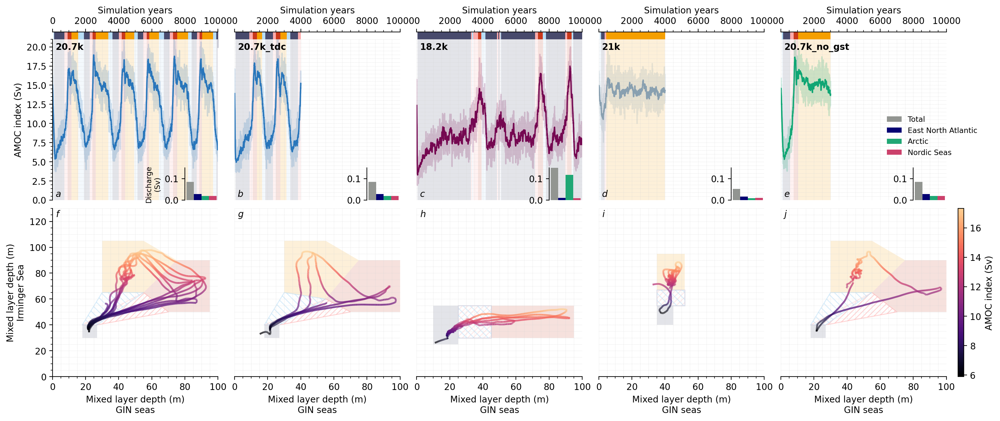

In [22]:
fig = plt.figure(figsize=(18, 7), dpi=200)

grid = fig.add_gridspec(2, 1, hspace=0.05)
grid_ts = gridspec.GridSpecFromSubplotSpec(2, 5, subplot_spec=grid[0], height_ratios=[1,10],
                                           wspace=0.1, hspace=-0.1)
grid_mld = gridspec.GridSpecFromSubplotSpec(1, 5, subplot_spec=grid[1], wspace=0.1)

axSPAN, axAMOC, axMLD = {}, {}, {}

axSPAN = {'tfgbi':fig.add_subplot(grid_ts[0,0]), 
          'xoupk':fig.add_subplot(grid_ts[0,1]), 
          'xoupf':fig.add_subplot(grid_ts[0,2]),
          'xouph':fig.add_subplot(grid_ts[0,3]), 
          'xppbf':fig.add_subplot(grid_ts[0,4])}

axAMOC['tfgbi']=fig.add_subplot(grid_ts[1,0], sharex=axSPAN['tfgbi'])
axAMOC['xoupk']=fig.add_subplot(grid_ts[1,1], sharex=axSPAN['xoupk'], sharey=axAMOC['tfgbi'])
axAMOC['xoupf']=fig.add_subplot(grid_ts[1,2], sharex=axSPAN['xoupf'], sharey=axAMOC['tfgbi'])
axAMOC['xouph']=fig.add_subplot(grid_ts[1,3], sharex=axSPAN['xouph'], sharey=axAMOC['tfgbi']) 
axAMOC['xppbf']=fig.add_subplot(grid_ts[1,4], sharex=axSPAN['xppbf'], sharey=axAMOC['tfgbi'])

axMLD = {'tfgbi':fig.add_subplot(grid_mld[0,0]), 
          'xoupk':fig.add_subplot(grid_mld[0,1]), 
          'xoupf':fig.add_subplot(grid_mld[0,2]),
          'xouph':fig.add_subplot(grid_mld[0,3]), 
          'xppbf':fig.add_subplot(grid_mld[0,4])}


fig.subplots_adjust(wspace=0.1)

projection_map = ccrs.NearsidePerspective(central_longitude=-30, central_latitude=70, satellite_height=3000000)

time = {}
cax_hist = {}


# Plots
for expt in axAMOC.keys():
    time[expt] = amoc_ts[expt].t.dt.year-1000
    
    # Plot spans and overlay
    for phase in spans[expt].keys():
        axSPAN[expt].imshow(np.expand_dims(span_conditions[expt][phase], axis=0), aspect='auto',
                            cmap = ListedColormap(['None', color_spans[phase]]))

        for span in spans[expt][phase]:
            axAMOC[expt].axvspan(span[0], span[1], alpha=0.15, linewidth=0, color=color_spans[phase])
    
    #Plot AMOC
    axAMOC[expt].plot(amoc_ts[expt].t.dt.year-1000, util.rmean(amoc_ts[expt],30), color=color_expts[expt])
    axAMOC[expt].plot(amoc_ts[expt].t.dt.year-1000, amoc_ts[expt], color=color_expts[expt], alpha=0.2)
    
    
    # Distribution histogram
    cax_hist[expt] = fig.add_axes([axAMOC[expt].get_position().x0 + axAMOC[expt].get_position().width*4/5,
                                   axAMOC[expt].get_position().y0,
                                   axAMOC[expt].get_position().width/5,
                                   axAMOC[expt].get_position().height/5], 
                                  facecolor=None)
    cax_hist[expt].set_facecolor('None')
    
    width = 0.15
    multiplier = 3 
    for region, value in flux_expt[expt].items():
        offset = width * multiplier
        rects = cax_hist[expt].bar(offset, value, width, color=fluxes_color[region], label=fluxes_label[region])
        multiplier += 1
        
    # Plot MLD phase
    plot_LineCollection(axMLD[expt],mldf_zone[expt]['gin'], mldf_zone[expt]['irm'], alpha=0.8, lw=2, cm=cmap_amoc)
    

    # Add phases ax_boxes
    for phase in ['cold', 'merid', 'zonal']:
        axMLD[expt].fill(*span_regions[expt][phase].exterior.xy, facecolor=color_spans[phase], alpha=0.15)  
    axMLD[expt].fill(*span_regions[expt]['warming'].exterior.xy, facecolor='white', alpha=0.5, 
                     hatch="////", edgecolor=color_spans['warming'])
    axMLD[expt].fill(*span_regions[expt]['cooling'].exterior.xy, facecolor='white', alpha=0.5, 
                     hatch="\\\\\\", edgecolor=color_spans['cooling'])
plt.rcParams['hatch.linewidth'] = 1


# Plot AMOC colorbar
mappable = ScalarMappable()
mappable.set_array(amocf_ts[expt])
mappable.set_cmap(cmap_amoc)
cax = fig.add_axes([axMLD[expt].get_position().x1+0.01,axMLD[expt].get_position().y0,
                    0.005, axMLD[expt].get_position().height])
cb = plt.colorbar(mappable, cax=cax).set_label(f"AMOC index (Sv)")


# Span parameters
for ax in axSPAN.values():
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')    
    ax.yaxis.set_visible(False)
    for loc in ['left', 'right', 'bottom']:ax.spines[loc].set_visible(False)
    ax.set_xlim([0,10000])
    ax.set_xlabel("Simulation years")

        
# AMOC time series parameters
for ax in axAMOC.values(): 
    ax.tick_params(axis='x', colors='None', which='both')
    for loc in ['right', 'top', 'bottom']:ax.spines[loc].set_visible(False)
    ax.set_ylim([0,21])
axAMOC['tfgbi'].set_ylabel("AMOC index (Sv)")
for expt in ['xoupk', 'xoupf', 'xouph', 'xppbf']:
    axAMOC[expt].tick_params(axis='y', colors='None', which='both')
    axAMOC[expt].spines['left'].set_visible(False)


# Histogram parameters
for cax in cax_hist.values():
    for loc in ['right', 'top', 'bottom']:cax.spines[loc].set_visible(False)
    cax.xaxis.set_visible(False)
    cax.set_ylim([0,0.15])
cax_hist['tfgbi'].set_ylabel("Discharge\n(Sv)", fontsize='small')
cax_hist['xppbf'].legend(fontsize='small', loc='lower left', bbox_to_anchor=(-1, 1.15),
                         facecolor='None', edgecolor='None')

    
# Phase parameters
for ax in axMLD.values(): 
    ax.set_xlim([0,100])
    ax.set_ylim([0,130])
    for loc in ['right', 'top']:ax.spines[loc].set_visible(False)
    ax.set_xlabel('Mixed layer depth (m)\nGIN seas')
axMLD['tfgbi'].set_ylabel('Mixed layer depth (m)\nIrminger Sea')
for expt in ['xoupk', 'xoupf', 'xouph', 'xppbf']:
    axMLD[expt].tick_params(axis='y', colors='None', which='both')
    axMLD[expt].spines['left'].set_visible(False)


# Time series parameters
for ax in np.array([list(axAMOC.values()), list(axMLD.values())]).flat:
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.grid(which='both', color='lightgrey', linestyle='--', linewidth=0.2, zorder=0)
    
    
# Annotations
## Add expt name to AMOC pannels

for expt in axAMOC.keys():
    txt = axAMOC[expt].annotate(f"{label_expts[expt]}", xy=(0.02, 0.95),
                                xycoords='axes fraction',
                                size='medium', va='center', ha='left', color='black', 
                                weight='bold')

## Labels
i = count(0)
for ax in axAMOC.values():
    label = alc[next(i)]
    ax.annotate(label, xy=(0.02,0.02), xycoords='axes fraction',
                         size=10, style='italic')
    
for ax in axMLD.values():
    label = alc[next(i)]
    ax.annotate(label, xy=(0.02,0.95), xycoords='axes fraction',
                         size=10, style='italic')


In [23]:
# fig.savefig(f"{output_folder}/si//anatomy_expanded.png", bbox_extra_artists=(), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si//anatomy_expanded.pdf", bbox_extra_artists=(), bbox_inches='tight', format='pdf')

## Figure S3 - Spectral analysis

In [24]:
amoc_ts = {}
amocf_ts = {}

for expt in ['tfgbi', 'xoupk', 'xoupf', 'xouph', 'xppbf']:
    ts = xr.open_dataset(f"{data_folder}/{expt}/{expt}.merid.annual.nc")
    amoc_ts[expt] = ts.Merid_Atlantic.sel(latitude=26.5, method='nearest').max('depth').sortby('t')
    amocf_ts[expt] = filt.process(amoc_ts[expt].values)
    

In [25]:
filt, psd, fq, harm, fc, ngripf, ngripf_u = {}, {}, {}, {}, {}, {}, {}

for expt in ['tfgbi', 'xoupk', 'xoupf', 'xouph', 'xppbf']:
    psd[expt], fq[expt] = util.psd(amoc_ts[expt], fs=1, scale_by_freq=True)
    harm[expt] = np.where(fq[expt]<=10**-1)
    fc[expt] = util.fundamental_fq(psd[expt], fq[expt])
    filt[expt] = util.ButterLowPass(order=1, fc=fc[expt], fs=1, mult=3)
    

Text(0.01, 0.85, 'b')

/tmp/ipykernel_190982/120967761.py:20: RuntimeWarning: divide by zero encountered in divide
  axZoom.secondary_xaxis('top', functions=(lambda a : 1/a, lambda a : 1/a)).set_xlabel('Periodicity (yrs)')


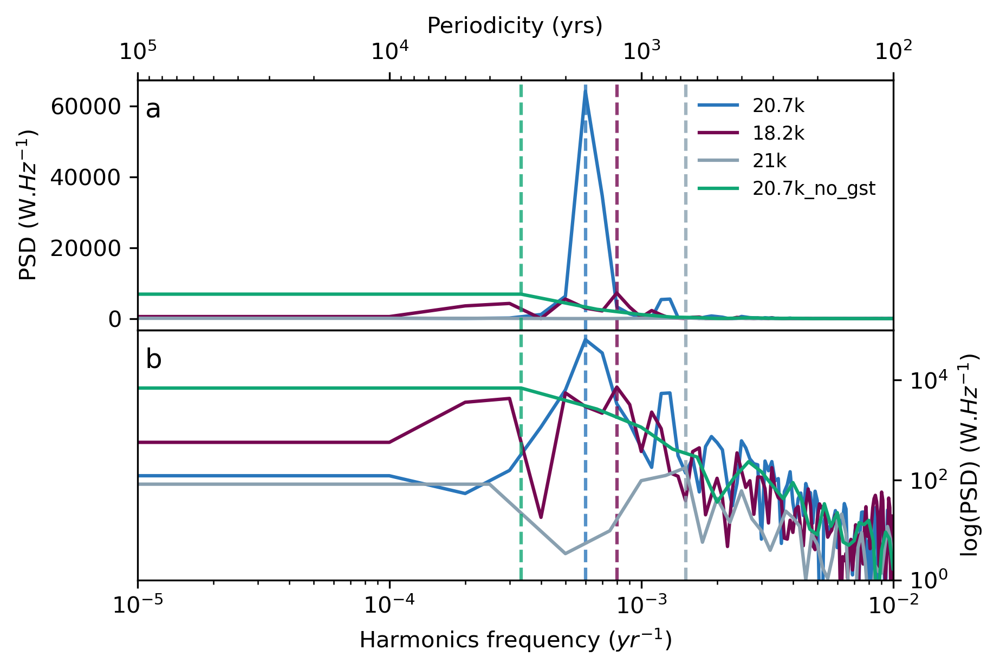

In [26]:
fig = plt.figure(figsize=(6,4), dpi=300)

gs = gridspec.GridSpec(nrows=2, ncols=1, hspace=0)
axZoom = fig.add_subplot(gs[0],facecolor='None')
axZoomLog = fig.add_subplot(gs[1],facecolor='None', sharex=axZoom)


for expt in ['tfgbi', 'xoupf', 'xouph', 'xppbf']:
    axZoom.semilogx(fq[expt][harm[expt]], psd[expt][harm[expt]], color=color_expts[expt], label=label_expts[expt])
    axZoom.axvline(fc[expt], linestyle='--', color=color_expts[expt], alpha=0.8)
    axZoomLog.loglog(fq[expt][harm[expt]][:100], psd[expt][harm[expt]][:100], color=color_expts[expt])
    axZoomLog.axvline(fc[expt], linestyle='--', color=color_expts[expt], alpha=0.8)

axZoom.set_ylabel(r"PSD (W.$Hz^{-1}$)")
axZoom.axes.xaxis.set_visible(True)
# axZoom.grid(which = 'both', color='lightgrey', linestyle='--', linewidth=0.5)
axZoom.set_xlim([10**-5, 10**-2])
# axZoom.set_ylim([1, 7*10**4])
axZoom.tick_params(axis='x', colors='None', which='both')
axZoom.secondary_xaxis('top', functions=(lambda a : 1/a, lambda a : 1/a)).set_xlabel('Periodicity (yrs)')
axZoom.legend(loc='upper right', fontsize='small', frameon=False)

axZoomLog.set_ylabel(r"log(PSD) (W.$Hz^{-1}$)")
axZoomLog.yaxis.set_ticks_position('right')
axZoomLog.yaxis.set_label_position('right')
# axZoomLog.grid(which = 'both', color='lightgrey', linestyle='--', linewidth=0.5)
axZoomLog.set_xlabel(r"Harmonics frequency ($yr^{-1}$)")
axZoomLog.set_ylim([1, 10**5])

axZoom.annotate('a', xy=(0.01,0.85), xycoords='axes fraction', size=12)
axZoomLog.annotate('b', xy=(0.01,0.85), xycoords='axes fraction', size=12)

In [27]:
# fig.savefig(f"{output_folder}/si/fq_analysis.png", bbox_extra_artists=(), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/fq_analysis.pdf", bbox_extra_artists=(), bbox_inches='tight', format='pdf')

## Figure S4 - North Atlantic dynamics at key deep water formation sites expanded

In [28]:
# Sea Ice
wice, sice = {}, {}

for expt in ['tfgbi', 'xoupf', 'xouph', 'xppbf']:
    ds_wice = xr.open_dataset(f"{data_folder}/{expt}/{expt}.iceconc.mr.nc").iceconc_mm_srf.isel(surface=0)
    ds_sice = xr.open_dataset(f"{data_folder}/{expt}/{expt}.iceconc.sp.nc").iceconc_mm_srf.isel(surface=0)

    wice[expt], sice[expt] = {}, {}

    for zone in masks_na_atm.keys():
        print(f"__Processing {expt} - {zone}")
        wice[expt][zone] = (ds_wice*masks_na_atm[zone]).mean(
            dim=['longitude', 'latitude'])*100
        sice[expt][zone] = (ds_sice*masks_na_atm[zone]).mean(
            dim=['longitude', 'latitude'])*100


__Processing tfgbi - gin
__Processing tfgbi - irm
__Processing tfgbi - eur
__Processing tfgbi - ls
__Processing tfgbi - arc
__Processing xoupf - gin
__Processing xoupf - irm
__Processing xoupf - eur
__Processing xoupf - ls
__Processing xoupf - arc
__Processing xouph - gin
__Processing xouph - irm
__Processing xouph - eur
__Processing xouph - ls
__Processing xouph - arc
__Processing xppbf - gin
__Processing xppbf - irm
__Processing xppbf - eur
__Processing xppbf - ls
__Processing xppbf - arc


In [29]:
# MLD

mld_zone = {}

for expt in ['tfgbi', 'xoupf', 'xouph', 'xppbf']:

    temp_mld = xr.open_dataset(f"{data_folder}/{expt}/na_variables/{expt}.mld.zone_na.annual.nc").mld
    
    mld_zone[expt] = {}
    for zone in masks_na.keys():
        print(f"__Processing {expt} - {zone}")
        mld_zone[expt][zone] = temp_mld.sel(zone=zone)[1:]


__Processing tfgbi - gin
__Processing tfgbi - eur
__Processing tfgbi - irm
__Processing tfgbi - ls
__Processing tfgbi - spg
__Processing tfgbi - arc
__Processing xoupf - gin
__Processing xoupf - eur
__Processing xoupf - irm
__Processing xoupf - ls
__Processing xoupf - spg
__Processing xoupf - arc
__Processing xouph - gin
__Processing xouph - eur
__Processing xouph - irm
__Processing xouph - ls
__Processing xouph - spg
__Processing xouph - arc
__Processing xppbf - gin
__Processing xppbf - eur
__Processing xppbf - irm
__Processing xppbf - ls
__Processing xppbf - spg
__Processing xppbf - arc


In [30]:
# Streamfunction

stream_zone = {}

for expt in ['tfgbi', 'xoupf', 'xouph', 'xppbf']:

    temp_stream = xr.open_dataset(f"{data_folder}/{expt}/na_variables/{expt}.stream.zone_na.annual.nc").stream

    stream_zone[expt] = {}
    for zone in masks_na.keys():
        print(f"__Processing {expt} - {zone}")
        stream_zone[expt][zone] = -temp_stream.sel(zone=zone)[1:]


__Processing tfgbi - gin
__Processing tfgbi - eur
__Processing tfgbi - irm
__Processing tfgbi - ls
__Processing tfgbi - spg
__Processing tfgbi - arc
__Processing xoupf - gin
__Processing xoupf - eur
__Processing xoupf - irm
__Processing xoupf - ls
__Processing xoupf - spg
__Processing xoupf - arc
__Processing xouph - gin
__Processing xouph - eur
__Processing xouph - irm
__Processing xouph - ls
__Processing xouph - spg
__Processing xouph - arc
__Processing xppbf - gin
__Processing xppbf - eur
__Processing xppbf - irm
__Processing xppbf - ls
__Processing xppbf - spg
__Processing xppbf - arc


In [31]:
# Profiles

ocns, ocnt, ocnd = {}, {}, {}

for expt in ['tfgbi', 'xoupf', 'xouph', 'xppbf']:

    ocns[expt] = xr.open_dataset(f"{data_folder}/{expt}/na_variables/{expt}.oceansalipg.zone_na.annual.nc").salinity_ym_dpth
    ocnt[expt] = xr.open_dataset(f"{data_folder}/{expt}/na_variables/{expt}.oceantemppg.zone_na.annual.nc").temp_ym_dpth
    ocnd[expt] = xr.open_dataset(f"{data_folder}/{expt}/na_variables/{expt}.oceandenspg.zone_na.annual.nc").density


In [32]:
color_mld = 'xkcd:emerald'
color_spg = '#561643'


In [33]:
expt='tfgbi' # 20.7K

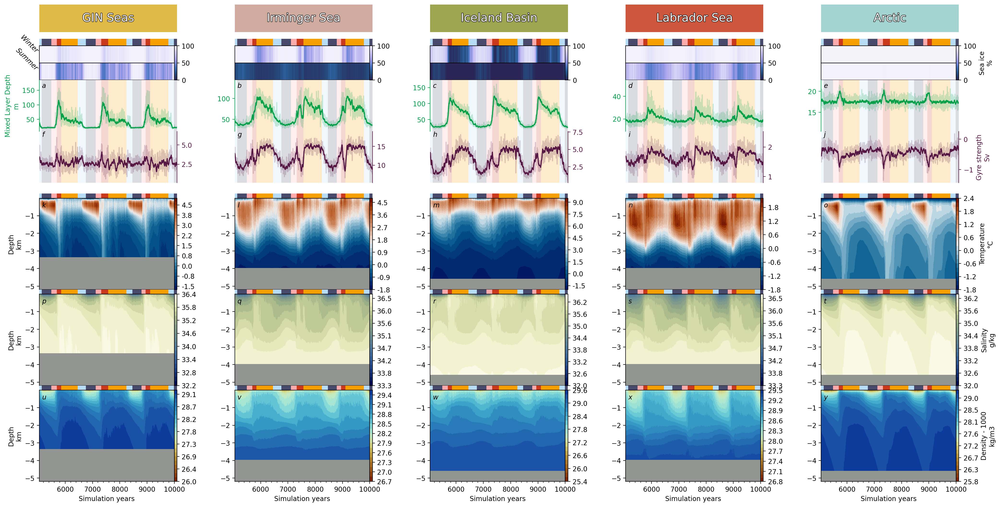

In [34]:
fig = plt.figure(figsize=(20, 12), dpi=200)

zones = ['gin', 'irm', 'eur', 'ls', 'arc']
subfigs = fig.subfigures(1, 5,  wspace=0.1)

grid_zone, grid_ts, grid_hov = {}, {}, {}
axSPANSts, axWICE, axSICE, axICE, axMLD, axSTREAM = {}, {}, {}, {}, {}, {}
axSPANST, axT, axSPANSS, axS, axSPANSD, axD,  = {}, {}, {}, {}, {}, {}

cmapIce = LinearSegmentedColormap.from_list('devon', SCM.devon(np.linspace(0.05, 0.95, 256)))
cmapT = LinearSegmentedColormap.from_list('vik', SCM.vik(np.linspace(0, 0.95, 256)))
cmapS = LinearSegmentedColormap.from_list('davos', SCM.davos(np.linspace(0, 0.95, 256)))
cmapD = LinearSegmentedColormap.from_list('roma', SCM.roma(np.linspace(0, 1, 256)))
cmT, cmS, cmD = {}, {}, {}



iterator = count(0)

for zone in zones:
    i = next(iterator)
    
    grid_zone[zone] = subfigs[i].add_gridspec(2, 1, height_ratios=[1,2], hspace=0.05)

    # Grid Surface
    grid_ts[zone] = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=grid_zone[zone][0],
                                                     hspace=0, height_ratios=[2,5,5,15,15])
    axSPANSts[zone] = subfigs[i].add_subplot(grid_ts[zone][0])
    axWICE[zone] = subfigs[i].add_subplot(grid_ts[zone][1], sharex=axSPANSts[zone])
    axSICE[zone] = subfigs[i].add_subplot(grid_ts[zone][2], sharex=axSPANSts[zone])
    axICE[zone] = subfigs[i].add_subplot(grid_ts[zone][1:3], sharex=axSPANSts[zone], facecolor='None')
    axMLD[zone] = subfigs[i].add_subplot(grid_ts[zone][3], sharex=axSPANSts[zone])
    axSTREAM[zone] = subfigs[i].add_subplot(grid_ts[zone][4], sharex=axSPANSts[zone])

    # Grid Hovmoller
    grid_hov[zone] = gridspec.GridSpecFromSubplotSpec(6, 1, subplot_spec=grid_zone[zone][1],
                                                     hspace=0, height_ratios=[1,20,1,20,1,20])
    axSPANST[zone] = subfigs[i].add_subplot(grid_hov[zone][0])
    axT[zone] = subfigs[i].add_subplot(grid_hov[zone][1], sharex=axSPANST[zone], facecolor='xkcd:grey')
    axSPANSS[zone] = subfigs[i].add_subplot(grid_hov[zone][2], sharex=axSPANST[zone])
    axS[zone] = subfigs[i].add_subplot(grid_hov[zone][3], sharex=axSPANST[zone], facecolor='xkcd:grey')
    axSPANSD[zone] = subfigs[i].add_subplot(grid_hov[zone][4], sharex=axSPANST[zone])
    axD[zone] = subfigs[i].add_subplot(grid_hov[zone][5], sharex=axSPANST[zone], facecolor='xkcd:grey')

    # Plot TS
    # Spans
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            axSPANSts[zone].axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

    # Sea ice
    normIce = Normalize(vmin=0, vmax=100)
    axWICE[zone].imshow(np.expand_dims(wice[expt][zone].values[:], axis=0), aspect='auto', 
                       cmap=cmapIce, norm=normIce)
    axSICE[zone].imshow(np.expand_dims(sice[expt][zone].values[:], axis=0), aspect='auto', 
                       cmap=cmapIce, norm=normIce)

    # MLD
    axMLD[zone].plot(mld_zone[expt][zone].t.dt.year-1000, util.rmean(mld_zone[expt][zone],30), color=color_mld)
    axMLD[zone].plot(mld_zone[expt][zone].t.dt.year-1000, mld_zone[expt][zone], color=color_mld, alpha=0.2)

    # Stremfunction
    axSTREAM[zone].plot(stream_zone[expt][zone].t.dt.year-1000, util.rmean(stream_zone[expt][zone],30)*1e-12, color=color_spg)
    axSTREAM[zone].plot(stream_zone[expt][zone].t.dt.year-1000, stream_zone[expt][zone]*1e-12, color=color_spg, alpha=0.2)


    # Plot Hovmoller
    # Spans
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            axSPANST[zone].axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])
            axSPANSS[zone].axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])
            axSPANSD[zone].axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

    # Hovmoller
    cmT[zone] = axT[zone].contourf(ocnt[expt].sel(zone=zone).t.dt.year-1000, -ocnt[expt].sel(zone=zone).depth_1/1000,
                            ocnt[expt].sel(zone=zone).transpose(), cmap=cmapT, levels=25)
    cmS[zone] = axS[zone].contourf(ocns[expt].sel(zone=zone).t.dt.year-1000, -ocns[expt].sel(zone=zone).depth_1/1000,
                            ocns[expt].sel(zone=zone).transpose(), cmap=cmapS, levels=25)
    cmD[zone] = axD[zone].contourf(ocnd[expt].sel(zone=zone).t.dt.year-1000, -ocnd[expt].sel(zone=zone).depth_1/1000,
                            ocnd[expt].sel(zone=zone).transpose()-1000, cmap=cmapD, levels=25)

    # Zone titles
    
    ax_box = axSPANSts[zone].get_position()

    cax = subfigs[i].add_axes([ax_box.x0, ax_box.y1 + ax_box.height,
                        ax_box.width, 
                        4*ax_box.height])

    cax.get_xaxis().set_visible(False)
    cax.get_yaxis().set_visible(False)
    for loc in ['left', 'right', 'bottom', 'top']: cax.spines[loc].set_visible(False)
    cax.set_facecolor(color_zones[zone])

    txt = cax.annotate(label_zones[zone], 
                       xy=(0.5, 0.5), xycoords='axes fraction', va='center', ha='center',
                       size='xx-large', color='white')
    txt.set_path_effects([PathEffects.withStroke(linewidth=1.2, foreground='black')])


axWICE['gin'].annotate('Winter', xy=(0, 0.5), xycoords='axes fraction', size=10,
                       fontstyle='italic', ha='right', va='bottom', rotation=-45)
axSICE['gin'].annotate('Summer', xy=(0, 0.5), xycoords='axes fraction', size=10,
                       fontstyle='italic', ha='right', va='bottom', rotation=-45)

# Spans Overlay
for ax in np.array([list(axMLD.values()), list(axSTREAM.values())]).flat:
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            ax.axvspan(span[0], span[1], alpha=0.2, linewidth=0, color=color_spans[phase])


# TS parameters
for ax in np.array([list(axMLD.values()), list(axSTREAM.values()),
                    list(axT.values()), list(axS.values()), list(axD.values())]).flat:
    ax.xaxis.set_minor_locator(AutoMinorLocator())

for ax in np.array([list(axT.values()), list(axS.values()), list(axD.values())]).flat:
    ax.yaxis.set_ticks([-1,-2,-3,-4,-5])

    
# Spans parameters
for ax in np.array([list(axSPANSts.values()), 
                    list(axSPANST.values()), list(axSPANSS.values()), list(axSPANSD.values())]).flat:
    ax.tick_params(axis='x', colors='None', which='both')
    ax.yaxis.set_visible(False)
    ax.set_ylim([0,1])
    ax.set_xlim([5050,10000])
    for loc in ['left', 'right', 'bottom', 'top']:ax.spines[loc].set_visible(False)

        
# Sea Ice parameters
for ax in axWICE.values():
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
        
for ax in axSICE.values():
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    
# Sea Ice colorbars
cm = ScalarMappable(cmap=cmapIce, norm=normIce) 
for zone in  ['gin', 'irm', 'eur', 'ls']:
    axICE[zone].set_visible(False)
    cb = plt.colorbar(cm, cax=make_axes_locatable(axICE[zone]).append_axes(
    "right", size="2%", pad=0))
    
axICE['arc'].set_visible(False)
cb = plt.colorbar(cm, cax=make_axes_locatable(axICE['arc']).append_axes(
    "right", size="2%", pad=0), label="Sea ice\n%")

    
# MLD parameters
for ax in axMLD.values():
    ax.tick_params(axis='x', colors='None', which='both')
    for loc in ['right', 'top', 'bottom']:ax.spines[loc].set_visible(False)
    ax.yaxis.set_ticks_position('left')
    ax.yaxis.set_label_position('left')    
    ax.spines['left'].set_color(color_mld)
    ax.tick_params(axis='y', colors=color_mld)    
axMLD['gin'].set_ylabel("Mixed Layer Depth\nm", size=10, color=color_mld)

# Stream parameters
for ax in axSTREAM.values():
    ax.tick_params(axis='x', colors='None', which='both')
    for loc in ['left', 'top', 'bottom']:ax.spines[loc].set_visible(False)
    ax.yaxis.set_ticks_position('right')
    ax.yaxis.set_label_position('right')    
    ax.spines['right'].set_color(color_spg)
    ax.tick_params(axis='y', colors=color_spg)    
axSTREAM['arc'].set_ylabel("Gyre strength\nSv", size=10, color=color_spg)


# Hovmoller colorabars
fmt = lambda x, pos: '{:.1f}'.format(x)

for zone in  ['gin', 'irm', 'eur', 'ls']:
    cb = plt.colorbar(cmT[zone], cax=make_axes_locatable(axT[zone]).append_axes(
        "right", size="2%", pad=0), format=FuncFormatter(fmt))
    cb = plt.colorbar(cmS[zone], cax=make_axes_locatable(axS[zone]).append_axes(
        "right", size="2%", pad=0), format=FuncFormatter(fmt))
    cb = plt.colorbar(cmD[zone], cax=make_axes_locatable(axD[zone]).append_axes(
        "right", size="2%", pad=0), format=FuncFormatter(fmt))

cb = plt.colorbar(cmT['arc'], cax=make_axes_locatable(axT['arc']).append_axes(
    "right", size="2%", pad=0), format=FuncFormatter(fmt)).set_label(f"Temperature\n°C")
cb = plt.colorbar(cmS['arc'], cax=make_axes_locatable(axS['arc']).append_axes(
    "right", size="2%", pad=0), format=FuncFormatter(fmt)).set_label(f"Salinity\ng/kg")
cb = plt.colorbar(cmD['arc'], cax=make_axes_locatable(axD['arc']).append_axes(
    "right", size="2%", pad=0), format=FuncFormatter(fmt)).set_label(f"Density - 1000\nkg/m3")


# Hovmoller parameter
    
for ax in np.array([list(axT.values()), list(axS.values())]).flat:
    ax.tick_params(axis='x', colors='None', which='both')
for ax in axD.values(): ax.set_xlabel("Simulation years")


axT['gin'].set_ylabel("Depth\nkm")
axS['gin'].set_ylabel("Depth\nkm")
axD['gin'].set_ylabel("Depth\nkm")


# Annotations

i = count(0)
for zone in zones:
    axMLD[zone].annotate(alc[next(i)], xy=(0.02,0.85), xycoords='axes fraction',
                         size=10, style='italic')
for zone in zones:
    axSTREAM[zone].annotate(alc[next(i)], xy=(0.02,0.9), xycoords='axes fraction',
                         size=10, style='italic')
for zone in zones:
    axT[zone].annotate(alc[next(i)], xy=(0.02,0.9), xycoords='axes fraction',
                         size=10, style='italic')
for zone in zones:
    axS[zone].annotate(alc[next(i)], xy=(0.02,0.9), xycoords='axes fraction',
                         size=10, style='italic')
for zone in zones:
    axD[zone].annotate(alc[next(i)], xy=(0.02,0.9), xycoords='axes fraction',
                         size=10, style='italic')


In [35]:
# fig.savefig(f"{output_folder}/si/na_expanded.png", bbox_extra_artists=(), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/na_expanded.pdf", bbox_extra_artists=(), bbox_inches='tight', format='pdf')

## Figure S5 - Global salinity means

In [36]:
salinity_means = {}
for expt in ['xoupa', 'tfgbi']:
    salinity_means[expt] = xr.open_dataset(f"{data_folder}/{expt}/salinity_budgets/{expt}.salinity_means.decadal.nc").salinity_means
    

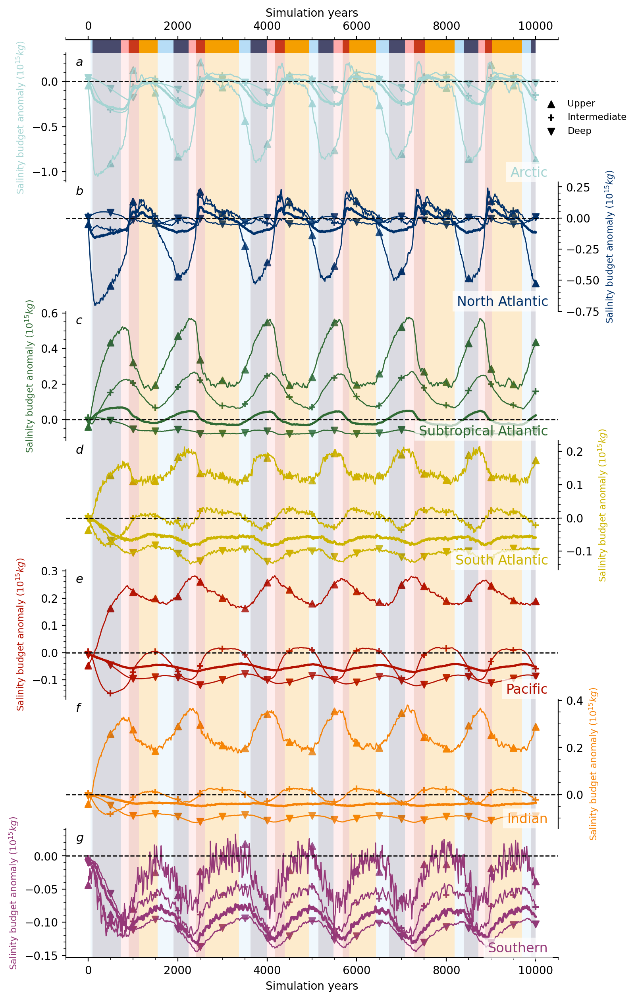

In [37]:
fig = plt.figure(figsize=(8, 15), dpi=200)

grid_master = fig.add_gridspec(8, 1, hspace=0,wspace=0.1, height_ratios=[1,10,10,10,10,10,10,10])
lw=1

# Axes definition

axS = {}

axSPAN = fig.add_subplot(grid_master[0,0], facecolor='None')
axS['arc'] = fig.add_subplot(grid_master[1,0], facecolor='None', sharex=axSPAN)
axS['na'] = fig.add_subplot(grid_master[2,0], facecolor='None', sharex=axSPAN)
axS['tpa'] = fig.add_subplot(grid_master[3,0], facecolor='None', sharex=axSPAN)
axS['sa'] = fig.add_subplot(grid_master[4,0], facecolor='None', sharex=axSPAN)
axS['pac'] = fig.add_subplot(grid_master[5,0], facecolor='None', sharex=axSPAN)
axS['idn'] = fig.add_subplot(grid_master[6,0], facecolor='None', sharex=axSPAN)
axS['so'] = fig.add_subplot(grid_master[7,0], facecolor='None', sharex=axSPAN)

start = 10

# Plot the spans
for phase in spans[expt].keys():
    for span in spans[expt][phase]:
        axSPAN.axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

# Plot Salinity
for zone in masks.keys():
    for depth in depths.keys():
        lw_sal = lw*2 if depth=='tot' else lw

        axS[zone].plot(salinity_means['tfgbi'].sel(zone=zone).sel(depth=depth).t.dt.year - 1000,
                       (salinity_means['tfgbi'].sel(zone=zone).sel(depth=depth) \
                        - np.mean(salinity_means['xoupa'].sel(zone=zone).sel(depth=depth))), 
                       lw=lw_sal,color=color_zones[zone])
        if depth != 'tot':
            axS[zone].scatter(salinity_means['tfgbi'].sel(zone=zone).sel(depth=depth).t.dt.year[::50] - 1000,
                        (salinity_means['tfgbi'].sel(zone=zone).sel(depth=depth)[::50] \
                         - np.mean(salinity_means['xoupa'].sel(zone=zone).sel(depth=depth))), 
                        color=color_zones[zone], marker=marker_depth[depth])

                   
# Time series parameters
for ax in axS.values():
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.axhline(0, color='black', lw=1, linestyle='--')

for ax in list(axS.values())[::2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

for ax in list(axS.values())[1::2]:
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.yaxis.set(ticks_position='right', label_position='right')

for ax in list(axS.values())[:-1]: 
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', colors='None', which='both')
list(axS.values())[-1].set_xlabel("Simulation years")

# SPAN parameters
axSPAN.set_xlabel("Simulation years")
axSPAN.xaxis.set_ticks_position('top')
axSPAN.xaxis.set_label_position('top')    
axSPAN.yaxis.set_visible(False)
axSPAN.set_ylim([0,1])
for loc in ['left', 'right', 'bottom']:axSPAN.spines[loc].set_visible(False)

for ax in axS.values():
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            ax.axvspan(span[0], span[1], alpha=0.2, linewidth=0, color=color_spans[phase])

# Salinity parameters
for zone in masks.keys():
    axS[zone].annotate(label_zones[zone], 
                       xy=(0.98, 0.02), xycoords='axes fraction', va='bottom', ha='right',
                       size='large', color=color_zones[zone], 
                       bbox=dict(facecolor='white', alpha=0.7, edgecolor='None'))
    axS[zone].set_ylabel(f"Salinity budget anomaly "r"($10^{15}kg$)",
                         color=color_zones[zone], fontsize='small')
    
# Depth legend

for depth in depths.keys():
    if depth != 'tot':
        axS['arc'].scatter([], [], 
                           color='k', marker=marker_depth[depth], label=label_depth_short[depth])
lgd = axS['arc'].legend(loc='center left', fontsize='small', bbox_to_anchor=(0.95, 0.5), frameon=False)

# Annotations
i = count(0)
for ax in axS.values():
    ax.annotate(alc[next(i)], xy=(0.02,0.9), xycoords='axes fraction',
                         size=11, style='italic')
    

In [38]:
# fig.savefig(f"{output_folder}/si/salinity_means.png", bbox_extra_artists=([lgd]), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/salinity_means.pdf", bbox_extra_artists=([lgd]), bbox_inches='tight', format='pdf')

## Figure S6 - Global salt content budgets

In [39]:
salinity_clusters = {}

for expt in ['xoupa', 'tfgbi']: 
    salinity_clusters[expt] = xr.open_dataset(f"{data_folder}/{expt}/salinity_budgets/{expt}.salinity_clusters.decadal.nc").salinity_cluster

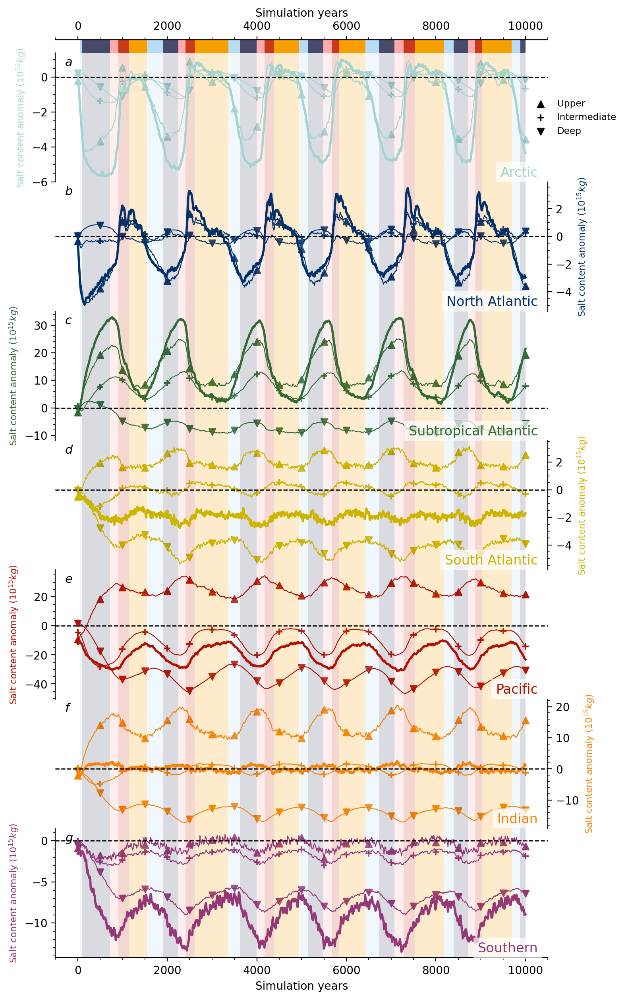

In [40]:
fig = plt.figure(figsize=(8, 15), dpi=200)

grid_master = fig.add_gridspec(8, 1, hspace=0,wspace=0.1, height_ratios=[1,10,10,10,10,10,10,10])
lw=0.8

# Axes definition

axS = {}

axSPAN = fig.add_subplot(grid_master[0,0], facecolor='None')
axS['arc'] = fig.add_subplot(grid_master[1,0], facecolor='None', sharex=axSPAN)
axS['na'] = fig.add_subplot(grid_master[2,0], facecolor='None', sharex=axSPAN)
axS['tpa'] = fig.add_subplot(grid_master[3,0], facecolor='None', sharex=axSPAN)
axS['sa'] = fig.add_subplot(grid_master[4,0], facecolor='None', sharex=axSPAN)
axS['pac'] = fig.add_subplot(grid_master[5,0], facecolor='None', sharex=axSPAN)
axS['idn'] = fig.add_subplot(grid_master[6,0], facecolor='None', sharex=axSPAN)
axS['so'] = fig.add_subplot(grid_master[7,0], facecolor='None', sharex=axSPAN)

start = 10

# Plot the spans
for phase in spans[expt].keys():
    for span in spans[expt][phase]:
        axSPAN.axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

# Plot Salinity
for zone in masks.keys():
    for depth in depths.keys():
        lw_sal = lw*2.5 if depth=='tot' else lw

        axS[zone].plot(salinity_clusters['tfgbi'].sel(zone=zone).sel(depth=depth).t.dt.year - 1000,
                       (salinity_clusters['tfgbi'].sel(zone=zone).sel(depth=depth) \
                        - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))*1e-15, 
                       lw=lw_sal,color=color_zones[zone])
        if depth != 'tot':
            axS[zone].scatter(salinity_clusters['tfgbi'].sel(zone=zone).sel(depth=depth).t.dt.year[::50] - 1000,
                        (salinity_clusters['tfgbi'].sel(zone=zone).sel(depth=depth)[::50] \
                         - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))*1e-15, 
                        color=color_zones[zone], marker=marker_depth[depth])

                   
# Time series parameters
for ax in axS.values():
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.axhline(0, color='black', lw=1, linestyle='--')

for ax in list(axS.values())[::2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

for ax in list(axS.values())[1::2]:
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.yaxis.set(ticks_position='right', label_position='right')

for ax in list(axS.values())[:-1]: 
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='x', colors='None', which='both')
list(axS.values())[-1].set_xlabel("Simulation years")

# SPAN parameters
axSPAN.set_xlabel("Simulation years")
axSPAN.xaxis.set_ticks_position('top')
axSPAN.xaxis.set_label_position('top')    
axSPAN.yaxis.set_visible(False)
axSPAN.set_ylim([0,1])
for loc in ['left', 'right', 'bottom']:axSPAN.spines[loc].set_visible(False)

for ax in axS.values():
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            ax.axvspan(span[0], span[1], alpha=0.2, linewidth=0, color=color_spans[phase])

# Salinity parameters
for zone in masks.keys():
    axS[zone].annotate(label_zones[zone], 
                       xy=(0.98, 0.02), xycoords='axes fraction', va='bottom', ha='right',
                       size='large', color=color_zones[zone], 
                       bbox=dict(facecolor='white', alpha=0.7, edgecolor='None'))
    axS[zone].set_ylabel(f"Salt content anomaly "r"($10^{15}kg$)",
                         color=color_zones[zone], fontsize='small')
    
# Depth legend

for depth in depths.keys():
    if depth != 'tot':
        axS['arc'].scatter([], [], 
                           color='k', marker=marker_depth[depth], label=label_depth_short[depth])
lgd = axS['arc'].legend(loc='center left', fontsize='small', bbox_to_anchor=(0.95, 0.5), frameon=False)


# Annotations
i = count(0)
for ax in axS.values():
    ax.annotate(alc[next(i)], xy=(0.02,0.9), xycoords='axes fraction',
                         size=11, style='italic')


In [41]:
# fig.savefig(f"{output_folder}/si/salinity_budgets.png", bbox_extra_artists=([lgd]), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/salinity_budgets.pdf", bbox_extra_artists=([lgd]), bbox_inches='tight', format='pdf')

## Figure S7 to S13 - Salinity tendencies diagnostic

In [42]:
salinity_clusters = {}

for expt in ['xoupa', 'xoupk']: 
    salinity_clusters[expt] = xr.open_dataset(f"{data_folder}/{expt}/salinity_budgets/{expt}.salinity_clusters.decadal.nc").salinity_cluster

In [43]:
lw = {'adv':1, 'diff':1, 'sfc':1, 'med':1, 'ice':1, 'ml':1, 'conv':1,
      'tot':2, 'ds/dt':2}

marker_depth = {'sfc':'^', 'int':'+', 'deep':'v', 'tot':''}
depth_label = {'sfc':'Upper', 'int':'Intermediate', 'deep':'Deep', 'tot':'total'}

In [44]:
tdc_zone = xr.open_dataset(f"{data_folder}/{expt}/xoupk.dsv.zone.decadal.nc")

### Figure S8 - Tendencies in Arctic

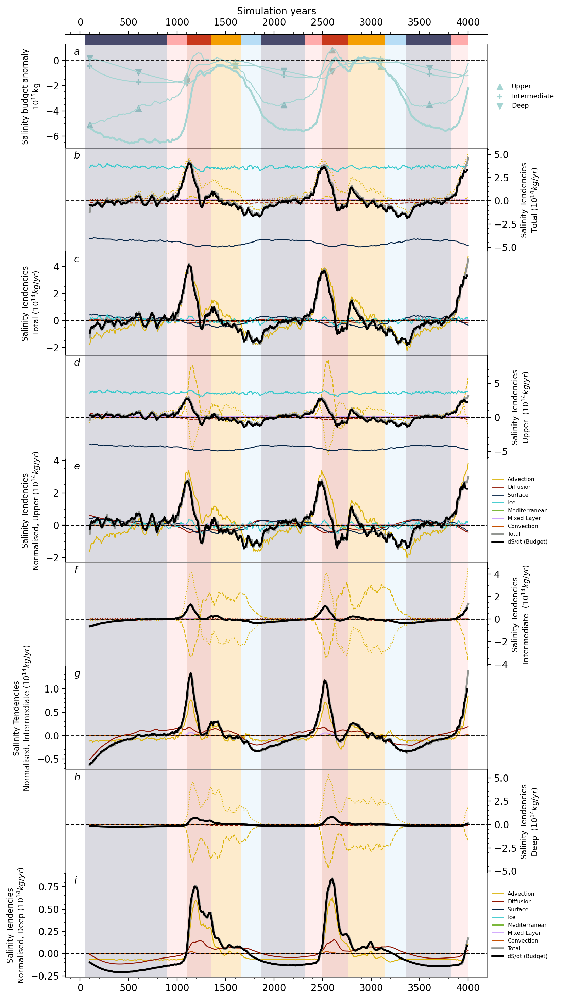

In [45]:
zone='arc'

fig = plt.figure(figsize=(8, 18), dpi=200)

grid_master = fig.add_gridspec(10, 1, hspace=0,wspace=0.1, height_ratios=[1,10,10,10,10,10,10,10,10,10])


# Axes definition

axTDC = {}

axSPAN = fig.add_subplot(grid_master[0,0], facecolor='None')
axS = fig.add_subplot(grid_master[1,0], facecolor='None', sharex=axSPAN)
axTDC['tot'] = fig.add_subplot(grid_master[2,0], facecolor='None', sharex=axSPAN)
axTDC['tot_n'] = fig.add_subplot(grid_master[3,0], facecolor='None', sharex=axSPAN)
axTDC['sfc'] = fig.add_subplot(grid_master[4,0], facecolor='None', sharex=axSPAN)
axTDC['sfc_n'] = fig.add_subplot(grid_master[5,0], facecolor='None', sharex=axSPAN)
axTDC['int'] = fig.add_subplot(grid_master[6,0], facecolor='None', sharex=axSPAN)
axTDC['int_n'] = fig.add_subplot(grid_master[7,0], facecolor='None', sharex=axSPAN)
axTDC['deep'] = fig.add_subplot(grid_master[8,0], facecolor='None', sharex=axSPAN)
axTDC['deep_n'] = fig.add_subplot(grid_master[9,0], facecolor='None', sharex=axSPAN)

axTS = np.array(np.array([axS, *list(axTDC.values())]).flat)

start = 10

# Plot the spans
for phase in spans[expt].keys():
    for span in spans[expt][phase]:
        axSPAN.axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

# Plot Salinity
for depth in depths.keys():
    lw_sal = 2 if depth=='tot' else 1
    
    axS.plot(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start:] -1000,
            (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
             - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start:]*1e-15, 
             lw=lw_sal,color=color_zones[zone])
    axS.scatter(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start::50] -1000,
           (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
            - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start::50]*1e-15, 
           color=color_zones[zone], marker=marker_depth[depth])
    if depth !='tot':
        axS.scatter([],[],color=color_zones[zone], marker=marker_depth[depth], label=depth_label[depth])


# Plot Tendencies

## Plot Absolute value

###Plotting Advection
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['advy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advxy'], lw=lw['adv'], ls=':')
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advz'], lw=lw['adv'], ls='--')

###Plotting Diffusion
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['diffy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffxy'], lw=lw['diff'], ls=':')
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffz'], lw=lw['diff'], ls='--')

## Plot all tendencies but advection and diffusion
for tdc in ['sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():

        # Plot Absolute value
        axTDC[depth].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                          (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                           color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])
        
## Plot Normalised value
for tdc in ['adv', 'diff', 'sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():
        # Plot Normalised value
        axTDC[depth+'_n'].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                               (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5)\
                               - np.mean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values))[start:]*1e-19,
                               color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])

    

## Plot actual total salinity changes
for depth in depths.keys():
    axTDC[depth].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))[start:]*1e-14, 5),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

    axTDC[depth+'_n'].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           (util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth)) \
                       - np.mean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))), 5)[start:]*1e-14),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

                   
# Time series parameters
for ax in axTS:
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
#     ax.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.5)
    ax.axhline(0, color='black', lw=1, linestyle='--')

for ax in axTS[::2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set(linewidth=1, color='grey')
    ax.spines['bottom'].set(linewidth=1, color='grey')

for ax in axTS[1::2]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set(linewidth=1, color='grey')
    ax.yaxis.set(ticks_position='right', label_position='right')

for ax in axTS[:-1]: 
    ax.tick_params(axis='x', colors='None', which='both')

# SPAN parameters
axSPAN.set_xlabel("Simulation years")
axSPAN.xaxis.set_ticks_position('top')
axSPAN.xaxis.set_label_position('top')    
axSPAN.yaxis.set_visible(False)
axSPAN.set_ylim([0,1])
for loc in ['left', 'right', 'bottom']:axSPAN.spines[loc].set_visible(False)

for ax in axTS:
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            ax.axvspan(span[0], span[1], alpha=0.2, linewidth=0, color=color_spans[phase])

# Salinity parameters
axS.set_ylabel(f"Salinity budget anomaly\n"r"$10^{15}$kg", fontsize='small')
axS.legend(loc='center left', fontsize='x-small', bbox_to_anchor=(1, 0.5), frameon=False)

            
# Tendencies parameters
for depth in ['sfc', 'int', 'deep']:
    axTDC[depth].set_ylabel(f"Salinity Tendencies\n{depth_label[depth]} "r" ($10^{14}kg/yr$)", fontsize='small')
    axTDC[depth+'_n'].set_ylabel(f"Salinity Tendencies\nNormalised, {depth_label[depth]}"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot_n'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')

axTDC['sfc_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
lgd=axTDC['deep_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
    
i = count(0)
for ax in axTS:
    ax.annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                         size=10, style='italic')



In [46]:
# fig.savefig(f"{output_folder}/si/tdc_{zone}.png", bbox_extra_artists=([lgd]), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/tdc_{zone}.pdf", bbox_extra_artists=([lgd]), bbox_inches='tight', format='pdf')

### Figure S9 - Tendencies in North Atlantic

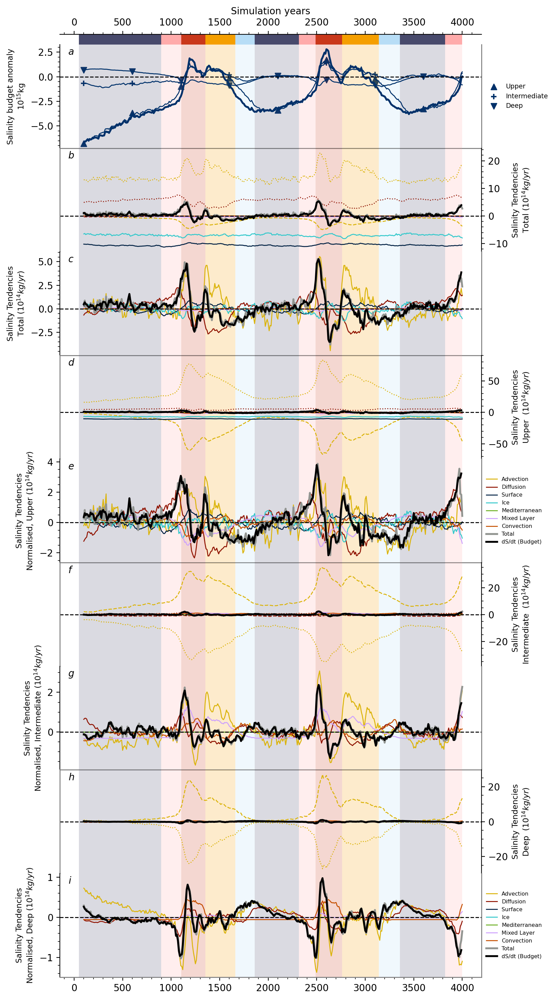

In [47]:
zone='na'

fig = plt.figure(figsize=(8, 18), dpi=200)

grid_master = fig.add_gridspec(10, 1, hspace=0,wspace=0.1, height_ratios=[1,10,10,10,10,10,10,10,10,10])


# Axes definition

axTDC = {}

axSPAN = fig.add_subplot(grid_master[0,0], facecolor='None')
axS = fig.add_subplot(grid_master[1,0], facecolor='None', sharex=axSPAN)
axTDC['tot'] = fig.add_subplot(grid_master[2,0], facecolor='None', sharex=axSPAN)
axTDC['tot_n'] = fig.add_subplot(grid_master[3,0], facecolor='None', sharex=axSPAN)
axTDC['sfc'] = fig.add_subplot(grid_master[4,0], facecolor='None', sharex=axSPAN)
axTDC['sfc_n'] = fig.add_subplot(grid_master[5,0], facecolor='None', sharex=axSPAN)
axTDC['int'] = fig.add_subplot(grid_master[6,0], facecolor='None', sharex=axSPAN)
axTDC['int_n'] = fig.add_subplot(grid_master[7,0], facecolor='None', sharex=axSPAN)
axTDC['deep'] = fig.add_subplot(grid_master[8,0], facecolor='None', sharex=axSPAN)
axTDC['deep_n'] = fig.add_subplot(grid_master[9,0], facecolor='None', sharex=axSPAN)

axTS = np.array(np.array([axS, *list(axTDC.values())]).flat)

start = 10

# Plot the spans
for phase in spans[expt].keys():
    for span in spans[expt][phase]:
        axSPAN.axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

# Plot Salinity
for depth in depths.keys():
    lw_sal = 2 if depth=='tot' else 1
    
    axS.plot(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start:] -1000,
            (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
             - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start:]*1e-15, 
             lw=lw_sal,color=color_zones[zone])
    axS.scatter(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start::50] -1000,
           (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
            - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start::50]*1e-15, 
           color=color_zones[zone], marker=marker_depth[depth])
    if depth !='tot':
        axS.scatter([],[],color=color_zones[zone], marker=marker_depth[depth], label=depth_label[depth])


# Plot Tendencies

## Plot Absolute value

###Plotting Advection
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['advy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advxy'], lw=lw['adv'], ls=':')
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advz'], lw=lw['adv'], ls='--')

###Plotting Diffusion
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['diffy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffxy'], lw=lw['diff'], ls=':')
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffz'], lw=lw['diff'], ls='--')

## Plot all tendencies but advection and diffusion
for tdc in ['sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():

        # Plot Absolute value
        axTDC[depth].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                          (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                           color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])
        
## Plot Normalised value
for tdc in ['adv', 'diff', 'sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():
        # Plot Normalised value
        axTDC[depth+'_n'].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                               (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5)\
                               - np.mean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values))[start:]*1e-19,
                               color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])

    

## Plot actual total salinity changes
for depth in depths.keys():
    axTDC[depth].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))[start:]*1e-14, 5),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

    axTDC[depth+'_n'].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           (util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth)) \
                       - np.mean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))), 5)[start:]*1e-14),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

                   
# Time series parameters
for ax in axTS:
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.axhline(0, color='black', lw=1, linestyle='--')

for ax in axTS[::2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set(linewidth=1, color='grey')
    ax.spines['bottom'].set(linewidth=1, color='grey')

for ax in axTS[1::2]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set(linewidth=1, color='grey')
    ax.yaxis.set(ticks_position='right', label_position='right')

for ax in axTS[:-1]: 
    ax.tick_params(axis='x', colors='None', which='both')

# SPAN parameters
axSPAN.set_xlabel("Simulation years")
axSPAN.xaxis.set_ticks_position('top')
axSPAN.xaxis.set_label_position('top')    
axSPAN.yaxis.set_visible(False)
axSPAN.set_ylim([0,1])
for loc in ['left', 'right', 'bottom']:axSPAN.spines[loc].set_visible(False)

for ax in axTS:
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            ax.axvspan(span[0], span[1], alpha=0.2, linewidth=0, color=color_spans[phase])

# Salinity parameters
axS.set_ylabel(f"Salinity budget anomaly\n"r"$10^{15}$kg", fontsize='small')
axS.legend(loc='center left', fontsize='x-small', bbox_to_anchor=(1, 0.5), frameon=False)

            
# Tendencies parameters
for depth in ['sfc', 'int', 'deep']:
    axTDC[depth].set_ylabel(f"Salinity Tendencies\n{depth_label[depth]} "r" ($10^{14}kg/yr$)", fontsize='small')
    axTDC[depth+'_n'].set_ylabel(f"Salinity Tendencies\nNormalised, {depth_label[depth]}"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot_n'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')

axTDC['sfc_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
lgd=axTDC['deep_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
    
i = count(0)
for ax in axTS:
    ax.annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                         size=10, style='italic')



In [48]:
# fig.savefig(f"{output_folder}/si/tdc_{zone}.png", bbox_extra_artists=([lgd]), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/tdc_{zone}.pdf", bbox_extra_artists=([lgd]), bbox_inches='tight', format='pdf')

### Figure S10 - Tendencies in Tropical & Subtropical Atlantic

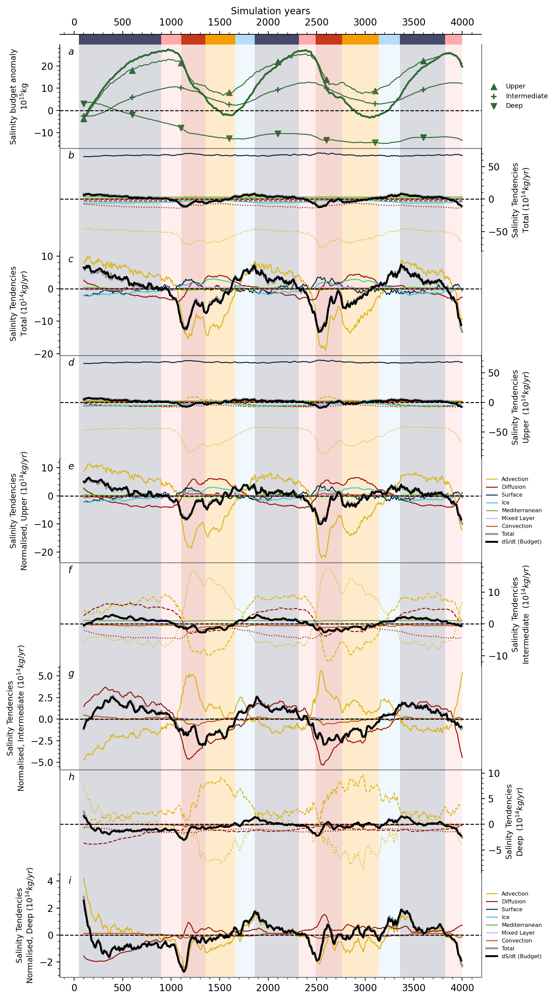

In [49]:
zone='tpa'

fig = plt.figure(figsize=(8, 18), dpi=200)

grid_master = fig.add_gridspec(10, 1, hspace=0,wspace=0.1, height_ratios=[1,10,10,10,10,10,10,10,10,10])


# Axes definition

axTDC = {}

axSPAN = fig.add_subplot(grid_master[0,0], facecolor='None')
axS = fig.add_subplot(grid_master[1,0], facecolor='None', sharex=axSPAN)
axTDC['tot'] = fig.add_subplot(grid_master[2,0], facecolor='None', sharex=axSPAN)
axTDC['tot_n'] = fig.add_subplot(grid_master[3,0], facecolor='None', sharex=axSPAN)
axTDC['sfc'] = fig.add_subplot(grid_master[4,0], facecolor='None', sharex=axSPAN)
axTDC['sfc_n'] = fig.add_subplot(grid_master[5,0], facecolor='None', sharex=axSPAN)
axTDC['int'] = fig.add_subplot(grid_master[6,0], facecolor='None', sharex=axSPAN)
axTDC['int_n'] = fig.add_subplot(grid_master[7,0], facecolor='None', sharex=axSPAN)
axTDC['deep'] = fig.add_subplot(grid_master[8,0], facecolor='None', sharex=axSPAN)
axTDC['deep_n'] = fig.add_subplot(grid_master[9,0], facecolor='None', sharex=axSPAN)

axTS = np.array(np.array([axS, *list(axTDC.values())]).flat)

start = 10

# Plot the spans
for phase in spans[expt].keys():
    for span in spans[expt][phase]:
        axSPAN.axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

# Plot Salinity
for depth in depths.keys():
    lw_sal = 2 if depth=='tot' else 1
    
    axS.plot(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start:] -1000,
            (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
             - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start:]*1e-15, 
             lw=lw_sal,color=color_zones[zone])
    axS.scatter(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start::50] -1000,
           (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
            - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start::50]*1e-15, 
           color=color_zones[zone], marker=marker_depth[depth])
    if depth !='tot':
        axS.scatter([],[],color=color_zones[zone], marker=marker_depth[depth], label=depth_label[depth])


# Plot Tendencies

## Plot Absolute value

###Plotting Advection
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['advy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advxy'], lw=lw['adv'], ls=':')
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advz'], lw=lw['adv'], ls='--')

###Plotting Diffusion
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['diffy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffxy'], lw=lw['diff'], ls=':')
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffz'], lw=lw['diff'], ls='--')

## Plot all tendencies but advection and diffusion
for tdc in ['sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():

        # Plot Absolute value
        axTDC[depth].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                          (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                           color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])
        
## Plot Normalised value
for tdc in ['adv', 'diff', 'sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():
        # Plot Normalised value
        axTDC[depth+'_n'].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                               (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5)\
                               - np.mean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values))[start:]*1e-19,
                               color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])

    

## Plot actual total salinity changes
for depth in depths.keys():
    axTDC[depth].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))[start:]*1e-14, 5),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

    axTDC[depth+'_n'].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           (util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth)) \
                       - np.mean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))), 5)[start:]*1e-14),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

                   
# Time series parameters
for ax in axTS:
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.axhline(0, color='black', lw=1, linestyle='--')

for ax in axTS[::2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set(linewidth=1, color='grey')
    ax.spines['bottom'].set(linewidth=1, color='grey')

for ax in axTS[1::2]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set(linewidth=1, color='grey')
    ax.yaxis.set(ticks_position='right', label_position='right')

# for ax in axTS: ax.spines['top'].set_visible(False)
for ax in axTS[:-1]: 
    ax.tick_params(axis='x', colors='None', which='both')

# SPAN parameters
axSPAN.set_xlabel("Simulation years")
axSPAN.xaxis.set_ticks_position('top')
axSPAN.xaxis.set_label_position('top')    
axSPAN.yaxis.set_visible(False)
axSPAN.set_ylim([0,1])
for loc in ['left', 'right', 'bottom']:axSPAN.spines[loc].set_visible(False)

for ax in axTS:
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            ax.axvspan(span[0], span[1], alpha=0.2, linewidth=0, color=color_spans[phase])

# Salinity parameters
axS.set_ylabel(f"Salinity budget anomaly\n"r"$10^{15}$kg", fontsize='small')
axS.legend(loc='center left', fontsize='x-small', bbox_to_anchor=(1, 0.5), frameon=False)

            
# Tendencies parameters
for depth in ['sfc', 'int', 'deep']:
    axTDC[depth].set_ylabel(f"Salinity Tendencies\n{depth_label[depth]} "r" ($10^{14}kg/yr$)", fontsize='small')
    axTDC[depth+'_n'].set_ylabel(f"Salinity Tendencies\nNormalised, {depth_label[depth]}"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot_n'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')

axTDC['sfc_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
lgd=axTDC['deep_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
    
i = count(0)
for ax in axTS:
    ax.annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                         size=10, style='italic')



In [50]:
# fig.savefig(f"{output_folder}/si/tdc_{zone}.png", bbox_extra_artists=([lgd]), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/tdc_{zone}.pdf", bbox_extra_artists=([lgd]), bbox_inches='tight', format='pdf')

### Figre S11 - Tendencies Atlantic

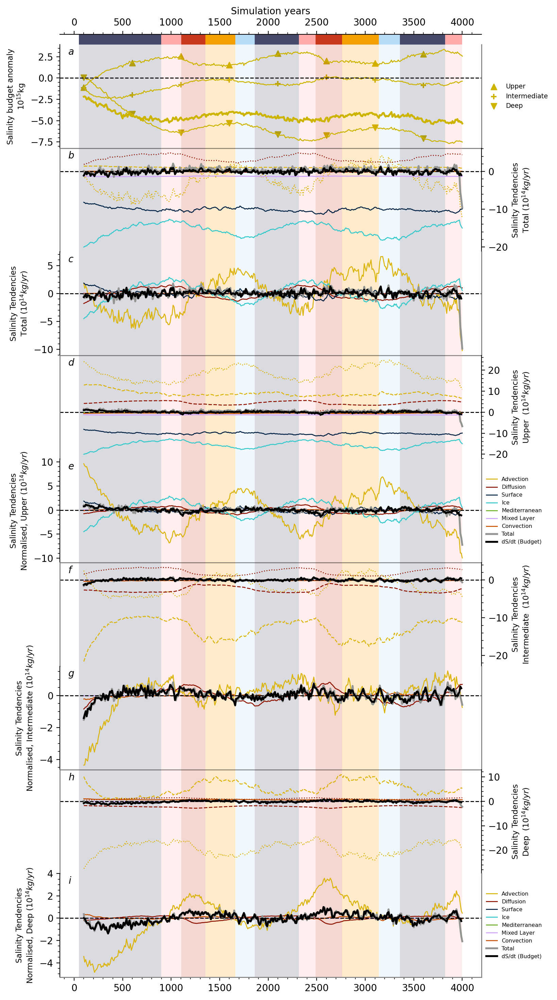

In [51]:
zone='sa'

fig = plt.figure(figsize=(8, 18), dpi=200)

grid_master = fig.add_gridspec(10, 1, hspace=0,wspace=0.1, height_ratios=[1,10,10,10,10,10,10,10,10,10])


# Axes definition

axTDC = {}

axSPAN = fig.add_subplot(grid_master[0,0], facecolor='None')
axS = fig.add_subplot(grid_master[1,0], facecolor='None', sharex=axSPAN)
axTDC['tot'] = fig.add_subplot(grid_master[2,0], facecolor='None', sharex=axSPAN)
axTDC['tot_n'] = fig.add_subplot(grid_master[3,0], facecolor='None', sharex=axSPAN)
axTDC['sfc'] = fig.add_subplot(grid_master[4,0], facecolor='None', sharex=axSPAN)
axTDC['sfc_n'] = fig.add_subplot(grid_master[5,0], facecolor='None', sharex=axSPAN)
axTDC['int'] = fig.add_subplot(grid_master[6,0], facecolor='None', sharex=axSPAN)
axTDC['int_n'] = fig.add_subplot(grid_master[7,0], facecolor='None', sharex=axSPAN)
axTDC['deep'] = fig.add_subplot(grid_master[8,0], facecolor='None', sharex=axSPAN)
axTDC['deep_n'] = fig.add_subplot(grid_master[9,0], facecolor='None', sharex=axSPAN)

axTS = np.array(np.array([axS, *list(axTDC.values())]).flat)

start = 10

# Plot the spans
for phase in spans[expt].keys():
    for span in spans[expt][phase]:
        axSPAN.axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

# Plot Salinity
for depth in depths.keys():
    lw_sal = 2 if depth=='tot' else 1
    
    axS.plot(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start:] -1000,
            (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
             - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start:]*1e-15, 
             lw=lw_sal,color=color_zones[zone])
    axS.scatter(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start::50] -1000,
           (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
            - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start::50]*1e-15, 
           color=color_zones[zone], marker=marker_depth[depth])
    if depth !='tot':
        axS.scatter([],[],color=color_zones[zone], marker=marker_depth[depth], label=depth_label[depth])


# Plot Tendencies

## Plot Absolute value

###Plotting Advection
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['advy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advxy'], lw=lw['adv'], ls=':')
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advz'], lw=lw['adv'], ls='--')

###Plotting Diffusion
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['diffy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffxy'], lw=lw['diff'], ls=':')
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffz'], lw=lw['diff'], ls='--')

## Plot all tendencies but advection and diffusion
for tdc in ['sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():

        # Plot Absolute value
        axTDC[depth].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                          (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                           color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])
        
## Plot Normalised value
for tdc in ['adv', 'diff', 'sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():
        # Plot Normalised value
        axTDC[depth+'_n'].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                               (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5)\
                               - np.mean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values))[start:]*1e-19,
                               color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])

    

## Plot actual total salinity changes
for depth in depths.keys():
    axTDC[depth].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))[start:]*1e-14, 5),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

    axTDC[depth+'_n'].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           (util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth)) \
                       - np.mean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))), 5)[start:]*1e-14),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

                   
# Time series parameters
for ax in axTS:
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
#     ax.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.5)
    ax.axhline(0, color='black', lw=1, linestyle='--')

for ax in axTS[::2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set(linewidth=1, color='grey')
    ax.spines['bottom'].set(linewidth=1, color='grey')

for ax in axTS[1::2]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set(linewidth=1, color='grey')
    ax.yaxis.set(ticks_position='right', label_position='right')

for ax in axTS[:-1]: 
    ax.tick_params(axis='x', colors='None', which='both')

# SPAN parameters
axSPAN.set_xlabel("Simulation years")
axSPAN.xaxis.set_ticks_position('top')
axSPAN.xaxis.set_label_position('top')    
axSPAN.yaxis.set_visible(False)
axSPAN.set_ylim([0,1])
for loc in ['left', 'right', 'bottom']:axSPAN.spines[loc].set_visible(False)

for ax in axTS:
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            ax.axvspan(span[0], span[1], alpha=0.2, linewidth=0, color=color_spans[phase])

# Salinity parameters
axS.set_ylabel(f"Salinity budget anomaly\n"r"$10^{15}$kg", fontsize='small')
axS.legend(loc='center left', fontsize='x-small', bbox_to_anchor=(1, 0.5), frameon=False)

            
# Tendencies parameters
for depth in ['sfc', 'int', 'deep']:
    axTDC[depth].set_ylabel(f"Salinity Tendencies\n{depth_label[depth]} "r" ($10^{14}kg/yr$)", fontsize='small')
    axTDC[depth+'_n'].set_ylabel(f"Salinity Tendencies\nNormalised, {depth_label[depth]}"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot_n'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')

axTDC['sfc_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
lgd=axTDC['deep_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
    
i = count(0)
for ax in axTS:
    ax.annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                         size=10, style='italic')



In [52]:
# fig.savefig(f"{output_folder}/si/tdc_{zone}.png", bbox_extra_artists=([lgd]), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/tdc_{zone}.pdf", bbox_extra_artists=([lgd]), bbox_inches='tight', format='pdf')

### Figure S12 - Tendencies Pacific

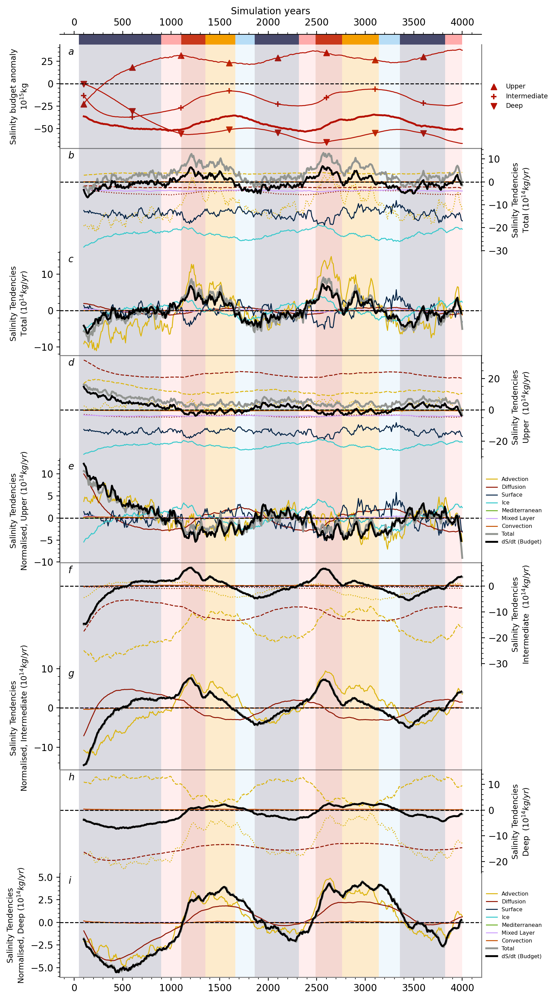

In [53]:
zone='pac'

fig = plt.figure(figsize=(8, 18), dpi=200)

grid_master = fig.add_gridspec(10, 1, hspace=0,wspace=0.1, height_ratios=[1,10,10,10,10,10,10,10,10,10])


# Axes definition

axTDC = {}

axSPAN = fig.add_subplot(grid_master[0,0], facecolor='None')
axS = fig.add_subplot(grid_master[1,0], facecolor='None', sharex=axSPAN)
axTDC['tot'] = fig.add_subplot(grid_master[2,0], facecolor='None', sharex=axSPAN)
axTDC['tot_n'] = fig.add_subplot(grid_master[3,0], facecolor='None', sharex=axSPAN)
axTDC['sfc'] = fig.add_subplot(grid_master[4,0], facecolor='None', sharex=axSPAN)
axTDC['sfc_n'] = fig.add_subplot(grid_master[5,0], facecolor='None', sharex=axSPAN)
axTDC['int'] = fig.add_subplot(grid_master[6,0], facecolor='None', sharex=axSPAN)
axTDC['int_n'] = fig.add_subplot(grid_master[7,0], facecolor='None', sharex=axSPAN)
axTDC['deep'] = fig.add_subplot(grid_master[8,0], facecolor='None', sharex=axSPAN)
axTDC['deep_n'] = fig.add_subplot(grid_master[9,0], facecolor='None', sharex=axSPAN)

axTS = np.array(np.array([axS, *list(axTDC.values())]).flat)

start = 10

# Plot the spans
for phase in spans[expt].keys():
    for span in spans[expt][phase]:
        axSPAN.axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

# Plot Salinity
for depth in depths.keys():
    lw_sal = 2 if depth=='tot' else 1
    
    axS.plot(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start:] -1000,
            (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
             - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start:]*1e-15, 
             lw=lw_sal,color=color_zones[zone])
    axS.scatter(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start::50] -1000,
           (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
            - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start::50]*1e-15, 
           color=color_zones[zone], marker=marker_depth[depth])
    if depth !='tot':
        axS.scatter([],[],color=color_zones[zone], marker=marker_depth[depth], label=depth_label[depth])


# Plot Tendencies

## Plot Absolute value

###Plotting Advection
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['advy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advxy'], lw=lw['adv'], ls=':')
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advz'], lw=lw['adv'], ls='--')

###Plotting Diffusion
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['diffy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffxy'], lw=lw['diff'], ls=':')
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffz'], lw=lw['diff'], ls='--')

## Plot all tendencies but advection and diffusion
for tdc in ['sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():

        # Plot Absolute value
        axTDC[depth].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                          (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                           color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])
        
## Plot Normalised value
for tdc in ['adv', 'diff', 'sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():
        # Plot Normalised value
        axTDC[depth+'_n'].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                               (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5)\
                               - np.mean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values))[start:]*1e-19,
                               color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])

    

## Plot actual total salinity changes
for depth in depths.keys():
    axTDC[depth].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))[start:]*1e-14, 5),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

    axTDC[depth+'_n'].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           (util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth)) \
                       - np.mean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))), 5)[start:]*1e-14),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

                   
# Time series parameters
for ax in axTS:
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
#     ax.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.5)
    ax.axhline(0, color='black', lw=1, linestyle='--')

for ax in axTS[::2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set(linewidth=1, color='grey')
    ax.spines['bottom'].set(linewidth=1, color='grey')

for ax in axTS[1::2]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set(linewidth=1, color='grey')
    ax.yaxis.set(ticks_position='right', label_position='right')

for ax in axTS[:-1]: 
    ax.tick_params(axis='x', colors='None', which='both')

# SPAN parameters
axSPAN.set_xlabel("Simulation years")
axSPAN.xaxis.set_ticks_position('top')
axSPAN.xaxis.set_label_position('top')    
axSPAN.yaxis.set_visible(False)
axSPAN.set_ylim([0,1])
for loc in ['left', 'right', 'bottom']:axSPAN.spines[loc].set_visible(False)

for ax in axTS:
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            ax.axvspan(span[0], span[1], alpha=0.2, linewidth=0, color=color_spans[phase])

# Salinity parameters
axS.set_ylabel(f"Salinity budget anomaly\n"r"$10^{15}$kg", fontsize='small')
axS.legend(loc='center left', fontsize='x-small', bbox_to_anchor=(1, 0.5), frameon=False)

            
# Tendencies parameters
for depth in ['sfc', 'int', 'deep']:
    axTDC[depth].set_ylabel(f"Salinity Tendencies\n{depth_label[depth]} "r" ($10^{14}kg/yr$)", fontsize='small')
    axTDC[depth+'_n'].set_ylabel(f"Salinity Tendencies\nNormalised, {depth_label[depth]}"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot_n'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')

axTDC['sfc_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
lgd=axTDC['deep_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
    
i = count(0)
for ax in axTS:
    ax.annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                         size=10, style='italic')



In [54]:
# fig.savefig(f"{output_folder}/si/tdc_{zone}.png", bbox_extra_artists=([lgd]), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/tdc_{zone}.pdf", bbox_extra_artists=([lgd]), bbox_inches='tight', format='pdf')

### Figure 13 - Tendencies Indian

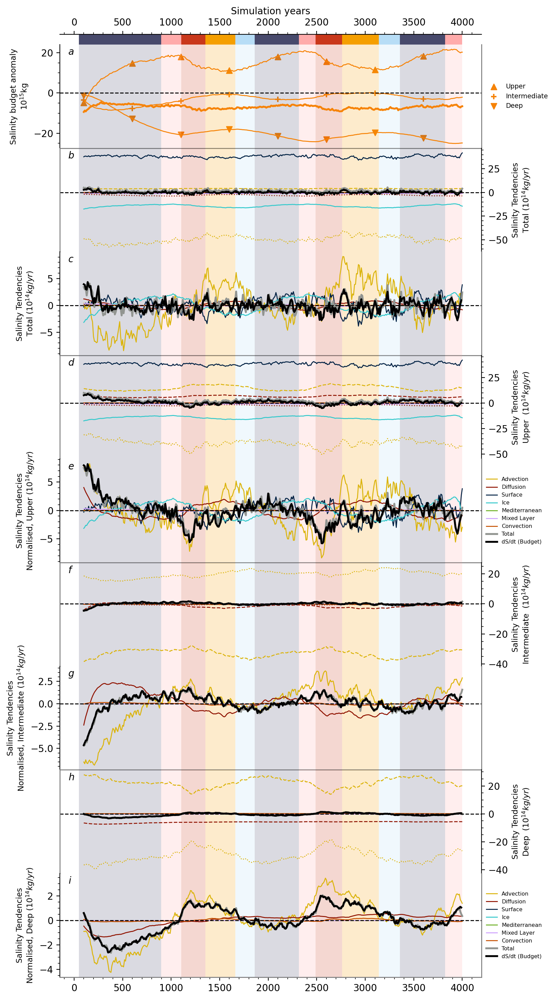

In [55]:
zone='idn'

fig = plt.figure(figsize=(8, 18), dpi=200)

grid_master = fig.add_gridspec(10, 1, hspace=0,wspace=0.1, height_ratios=[1,10,10,10,10,10,10,10,10,10])


# Axes definition

axTDC = {}

axSPAN = fig.add_subplot(grid_master[0,0], facecolor='None')
axS = fig.add_subplot(grid_master[1,0], facecolor='None', sharex=axSPAN)
axTDC['tot'] = fig.add_subplot(grid_master[2,0], facecolor='None', sharex=axSPAN)
axTDC['tot_n'] = fig.add_subplot(grid_master[3,0], facecolor='None', sharex=axSPAN)
axTDC['sfc'] = fig.add_subplot(grid_master[4,0], facecolor='None', sharex=axSPAN)
axTDC['sfc_n'] = fig.add_subplot(grid_master[5,0], facecolor='None', sharex=axSPAN)
axTDC['int'] = fig.add_subplot(grid_master[6,0], facecolor='None', sharex=axSPAN)
axTDC['int_n'] = fig.add_subplot(grid_master[7,0], facecolor='None', sharex=axSPAN)
axTDC['deep'] = fig.add_subplot(grid_master[8,0], facecolor='None', sharex=axSPAN)
axTDC['deep_n'] = fig.add_subplot(grid_master[9,0], facecolor='None', sharex=axSPAN)

axTS = np.array(np.array([axS, *list(axTDC.values())]).flat)

start = 10

# Plot the spans
for phase in spans[expt].keys():
    for span in spans[expt][phase]:
        axSPAN.axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

# Plot Salinity
for depth in depths.keys():
    lw_sal = 2 if depth=='tot' else 1
    
    axS.plot(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start:] -1000,
            (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
             - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start:]*1e-15, 
             lw=lw_sal,color=color_zones[zone])
    axS.scatter(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start::50] -1000,
           (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
            - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start::50]*1e-15, 
           color=color_zones[zone], marker=marker_depth[depth])
    if depth !='tot':
        axS.scatter([],[],color=color_zones[zone], marker=marker_depth[depth], label=depth_label[depth])


# Plot Tendencies

## Plot Absolute value

###Plotting Advection
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['advy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advxy'], lw=lw['adv'], ls=':')
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advz'], lw=lw['adv'], ls='--')

###Plotting Diffusion
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['diffy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffxy'], lw=lw['diff'], ls=':')
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffz'], lw=lw['diff'], ls='--')

## Plot all tendencies but advection and diffusion
for tdc in ['sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():

        # Plot Absolute value
        axTDC[depth].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                          (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                           color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])
        
## Plot Normalised value
for tdc in ['adv', 'diff', 'sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():
        # Plot Normalised value
        axTDC[depth+'_n'].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                               (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5)\
                               - np.mean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values))[start:]*1e-19,
                               color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])

    

## Plot actual total salinity changes
for depth in depths.keys():
    axTDC[depth].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))[start:]*1e-14, 5),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

    axTDC[depth+'_n'].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           (util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth)) \
                       - np.mean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))), 5)[start:]*1e-14),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

                   
# Time series parameters
for ax in axTS:
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.axhline(0, color='black', lw=1, linestyle='--')

for ax in axTS[::2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set(linewidth=1, color='grey')
    ax.spines['bottom'].set(linewidth=1, color='grey')

for ax in axTS[1::2]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set(linewidth=1, color='grey')
    ax.yaxis.set(ticks_position='right', label_position='right')

for ax in axTS[:-1]: 
    ax.tick_params(axis='x', colors='None', which='both')

# SPAN parameters
axSPAN.set_xlabel("Simulation years")
axSPAN.xaxis.set_ticks_position('top')
axSPAN.xaxis.set_label_position('top')    
axSPAN.yaxis.set_visible(False)
axSPAN.set_ylim([0,1])
for loc in ['left', 'right', 'bottom']:axSPAN.spines[loc].set_visible(False)

for ax in axTS:
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            ax.axvspan(span[0], span[1], alpha=0.2, linewidth=0, color=color_spans[phase])

# Salinity parameters
axS.set_ylabel(f"Salinity budget anomaly\n"r"$10^{15}$kg", fontsize='small')
axS.legend(loc='center left', fontsize='x-small', bbox_to_anchor=(1, 0.5), frameon=False)

            
# Tendencies parameters
for depth in ['sfc', 'int', 'deep']:
    axTDC[depth].set_ylabel(f"Salinity Tendencies\n{depth_label[depth]} "r" ($10^{14}kg/yr$)", fontsize='small')
    axTDC[depth+'_n'].set_ylabel(f"Salinity Tendencies\nNormalised, {depth_label[depth]}"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot_n'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')

axTDC['sfc_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
lgd=axTDC['deep_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
    
i = count(0)
for ax in axTS:
    ax.annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                         size=10, style='italic')



In [56]:
# fig.savefig(f"{output_folder}/si/tdc_{zone}.png", bbox_extra_artists=([lgd]), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/tdc_{zone}.pdf", bbox_extra_artists=([lgd]), bbox_inches='tight', format='pdf')

### Figure 14 - Tendencies SO

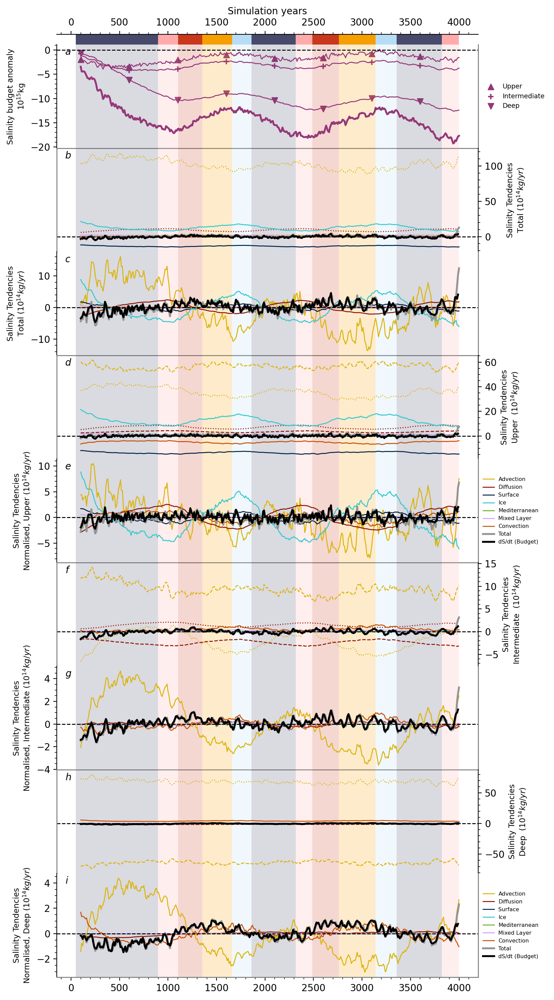

In [57]:
zone='so'

fig = plt.figure(figsize=(8, 18), dpi=200)

grid_master = fig.add_gridspec(10, 1, hspace=0,wspace=0.1, height_ratios=[1,10,10,10,10,10,10,10,10,10])


# Axes definition

axTDC = {}

axSPAN = fig.add_subplot(grid_master[0,0], facecolor='None')
axS = fig.add_subplot(grid_master[1,0], facecolor='None', sharex=axSPAN)
axTDC['tot'] = fig.add_subplot(grid_master[2,0], facecolor='None', sharex=axSPAN)
axTDC['tot_n'] = fig.add_subplot(grid_master[3,0], facecolor='None', sharex=axSPAN)
axTDC['sfc'] = fig.add_subplot(grid_master[4,0], facecolor='None', sharex=axSPAN)
axTDC['sfc_n'] = fig.add_subplot(grid_master[5,0], facecolor='None', sharex=axSPAN)
axTDC['int'] = fig.add_subplot(grid_master[6,0], facecolor='None', sharex=axSPAN)
axTDC['int_n'] = fig.add_subplot(grid_master[7,0], facecolor='None', sharex=axSPAN)
axTDC['deep'] = fig.add_subplot(grid_master[8,0], facecolor='None', sharex=axSPAN)
axTDC['deep_n'] = fig.add_subplot(grid_master[9,0], facecolor='None', sharex=axSPAN)

axTS = np.array(np.array([axS, *list(axTDC.values())]).flat)

start = 10

# Plot the spans
for phase in spans[expt].keys():
    for span in spans[expt][phase]:
        axSPAN.axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

# Plot Salinity
for depth in depths.keys():
    lw_sal = 2 if depth=='tot' else 1
    
    axS.plot(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start:] -1000,
            (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
             - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start:]*1e-15, 
             lw=lw_sal,color=color_zones[zone])
    axS.scatter(salinity_clusters[expt].sel(zone=zone).sel(depth=depth).t.dt.year[start::50] -1000,
           (salinity_clusters[expt].sel(zone=zone).sel(depth=depth)\
            - np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth=depth)))[start::50]*1e-15, 
           color=color_zones[zone], marker=marker_depth[depth])
    if depth !='tot':
        axS.scatter([],[],color=color_zones[zone], marker=marker_depth[depth], label=depth_label[depth])


# Plot Tendencies

## Plot Absolute value

###Plotting Advection
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['advy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advxy'], lw=lw['adv'], ls=':')
    axTDC[depth].plot(tdc_zone['adv'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['advz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['adv'], label=label_tdc['advz'], lw=lw['adv'], ls='--')

###Plotting Diffusion
for depth in depths.keys():

    # Plot Absolute value
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffx'].sel(zone=zone).sel(depth=depth).values + \
                                  tdc_zone['diffy'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffxy'], lw=lw['diff'], ls=':')
    axTDC[depth].plot(tdc_zone['diff'].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                      (util.rmean(tdc_zone['diffz'].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                       color=colors_tdc['diff'], label=label_tdc['diffz'], lw=lw['diff'], ls='--')

## Plot all tendencies but advection and diffusion
for tdc in ['sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():

        # Plot Absolute value
        axTDC[depth].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                          (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5))[start:]*1e-19,
                           color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])
        
## Plot Normalised value
for tdc in ['adv', 'diff', 'sfc', 'ice', 'med', 'ml', 'conv', 'tot']:
    for depth in depths.keys():
        # Plot Normalised value
        axTDC[depth+'_n'].plot(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).t.dt.year[start:]-1000,
                               (util.rmean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values,5)\
                               - np.mean(tdc_zone[tdc].sel(zone=zone).sel(depth=depth).values))[start:]*1e-19,
                               color=colors_tdc[tdc], label=label_tdc[tdc], lw=lw[tdc])

    

## Plot actual total salinity changes
for depth in depths.keys():
    axTDC[depth].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))[start:]*1e-14, 5),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

    axTDC[depth+'_n'].plot(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth).t.dt.year[start:-1]-1000,
           (util.rmean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth)) \
                       - np.mean(np.diff(salinity_clusters['xoupk'].sel(zone=zone).sel(depth=depth))), 5)[start:]*1e-14),
           color='xkcd:black', label='dS/dt (Budget)', lw=lw['ds/dt'])

                   
# Time series parameters
for ax in axTS:
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.axhline(0, color='black', lw=1, linestyle='--')

for ax in axTS[::2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set(linewidth=1, color='grey')
    ax.spines['bottom'].set(linewidth=1, color='grey')

for ax in axTS[1::2]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set(linewidth=1, color='grey')
    ax.yaxis.set(ticks_position='right', label_position='right')

for ax in axTS[:-1]: 
    ax.tick_params(axis='x', colors='None', which='both')

# SPAN parameters
axSPAN.set_xlabel("Simulation years")
axSPAN.xaxis.set_ticks_position('top')
axSPAN.xaxis.set_label_position('top')    
axSPAN.yaxis.set_visible(False)
axSPAN.set_ylim([0,1])
for loc in ['left', 'right', 'bottom']:axSPAN.spines[loc].set_visible(False)

for ax in axTS:
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            ax.axvspan(span[0], span[1], alpha=0.2, linewidth=0, color=color_spans[phase])

# Salinity parameters
axS.set_ylabel(f"Salinity budget anomaly\n"r"$10^{15}$kg", fontsize='small')
axS.legend(loc='center left', fontsize='x-small', bbox_to_anchor=(1, 0.5), frameon=False)

            
# Tendencies parameters
for depth in ['sfc', 'int', 'deep']:
    axTDC[depth].set_ylabel(f"Salinity Tendencies\n{depth_label[depth]} "r" ($10^{14}kg/yr$)", fontsize='small')
    axTDC[depth+'_n'].set_ylabel(f"Salinity Tendencies\nNormalised, {depth_label[depth]}"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')
axTDC['tot_n'].set_ylabel(f"Salinity Tendencies\nTotal"r" ($10^{14}kg/yr$)", fontsize='small')

axTDC['sfc_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
lgd=axTDC['deep_n'].legend(loc='center left', fontsize='xx-small', bbox_to_anchor=(1, 0.5), frameon=False)
    
i = count(0)
for ax in axTS:
    ax.annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                         size=10, style='italic')



In [58]:
# fig.savefig(f"{output_folder}/si/tdc_{zone}.png", bbox_extra_artists=([lgd]), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/tdc_{zone}.pdf", bbox_extra_artists=([lgd]), bbox_inches='tight', format='pdf')

## Figure S14 & S15 - North Atlantic vertical profiles

In [59]:
# Profiles
expt = 'xoupk'
ocns = xr.open_dataset(f"{data_folder}/{expt}/na_variables/{expt}.oceansalipg.zone_na.annual.nc").salinity_ym_dpth
ocnt = xr.open_dataset(f"{data_folder}/{expt}/na_variables/{expt}.oceantemppg.zone_na.annual.nc").temp_ym_dpth
ocnd = xr.open_dataset(f"{data_folder}/{expt}/na_variables/{expt}.oceandenspg.zone_na.annual.nc").density


In [60]:
expt='xoupk'

start_point = {'warming':spans[expt]['cold'][1][0], 'cooling':spans[expt]['zonal'][1][0]}
end_point = {'warming':spans[expt]['warming'][1][1], 'cooling':spans[expt]['cooling'][1][1]}


In [61]:
# Create colormap for hamstring
cmap_phase = {}

colors = [color_spans['cold'], color_spans['warming'], color_spans['merid']]
values = [spans[expt]['cold'][1][0], spans[expt]['cold'][1][1], spans[expt]['warming'][1][1]]
norm = matplotlib.colors.Normalize(vmin=min(values), vmax=max(values))  
normed_vals = norm(values)
cmap_phase['warming'] = LinearSegmentedColormap.from_list("cold_to_warm", list(zip(normed_vals, colors)), N=1000)  


colors = [color_spans['zonal'], color_spans['cooling'], color_spans['cold']]
values = [spans[expt]['zonal'][1][0], 
          spans[expt]['cooling'][1][1], spans[expt]['cooling'][1][1]]

norm = matplotlib.colors.Normalize(vmin=min(values), vmax=max(values))  
normed_vals = norm(values)
cmap_phase['cooling'] = LinearSegmentedColormap.from_list("cold_to_warm", list(zip(normed_vals, colors)), N=1000)  


### Figure S14 - Warming

In [62]:
phase = 'warming'
cmap = cmap_phase[phase]

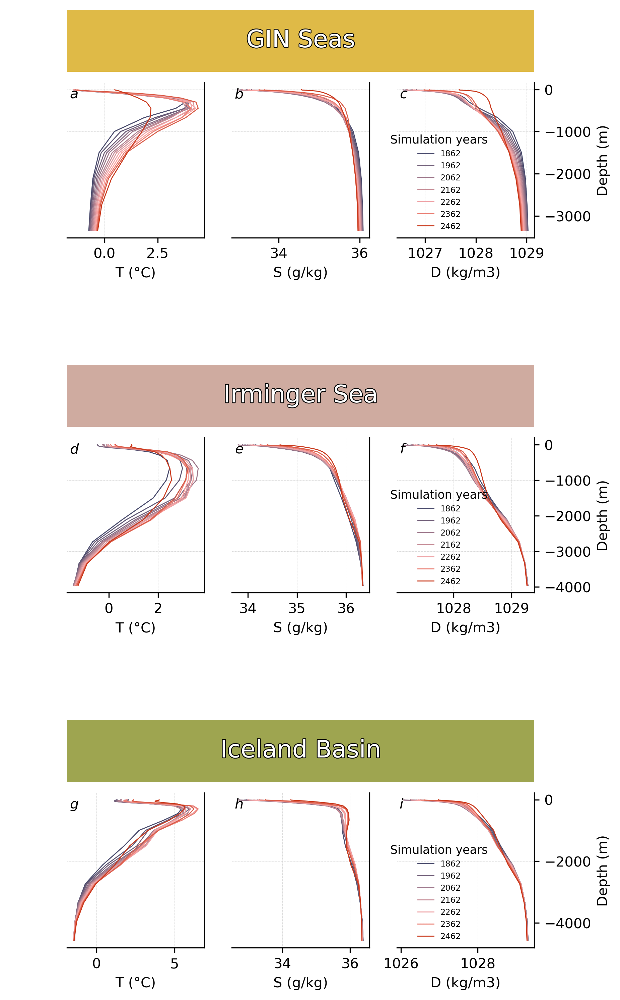

In [63]:
fig = plt.figure(figsize=(6, 10), dpi=300)

figHM = fig.subfigures(3, 1,  wspace=0.1, facecolor='None')

grid_zone = {}
axZone, axHMT, axHMS, axHMD = {}, {}, {}, {}
iterator = count(0)
for zone in ['gin', 'irm', 'eur']:
    i = next(iterator)
    grid_zone[zone] = figHM[i].add_gridspec(2, 3, height_ratios=[2,5], hspace=0.1)
    
    axZone[zone] = figHM[i].add_subplot(grid_zone[zone][0,:], facecolor='None')
    axHMT[zone] = figHM[i].add_subplot(grid_zone[zone][1,0], facecolor='None')
    axHMS[zone] = figHM[i].add_subplot(grid_zone[zone][1,1], facecolor='None')
    axHMD[zone] = figHM[i].add_subplot(grid_zone[zone][1,2], facecolor='None')

    
## Hamstring plots

decades = np.arange(int(start_point[phase]), int(end_point[phase]), 50)

### Plot Hamstrings
for zone in ['gin', 'irm', 'eur']:
    c_list = iter(cmap(np.linspace(0, 1, len(decades[::]))))
    i=0
    for decade in decades:
        c = next(c_list)
        axHMT[zone].plot(ocnt.sel(zone=zone).isel(t=slice(decade, decade+10)).mean('t'),
                         -ocnt.depth_1, 
                         color=c, lw=0.7)

        axHMS[zone].plot(ocns.sel(zone=zone).isel(t=slice(decade, decade+10)).mean('t'),
                         -ocns.depth_1, 
                         color=c, lw=0.7)

        if i%2 == 0:
            axHMD[zone].plot(ocnd.sel(zone=zone).isel(t=slice(decade, decade+10)).mean('t'),
                             -ocnd.sel(zone=zone).depth_1, 
                             label=decade,
                             color=c, lw=0.7)
        else:
            axHMD[zone].plot(ocnd.sel(zone=zone).isel(t=slice(decade, decade+10)).mean('t'),
                             -ocnd.sel(zone=zone).depth_1, 
                             color=c, lw=0.7)
        i+=1
        
        
    ### Titles
    axZone[zone].get_xaxis().set_visible(False)
    axZone[zone].get_yaxis().set_visible(False)
    for loc in ['left', 'right', 'bottom', 'top']: axZone[zone].spines[loc].set_visible(False)
    axZone[zone].set_facecolor(color_zones[zone])

    
    txt = axZone[zone].annotate(label_zones[zone], 
                       xy=(0.5, 0.5), xycoords='axes fraction', va='center', ha='center',
                       size='xx-large', color='white')
    txt.set_path_effects([PathEffects.withStroke(linewidth=1.2, foreground='black')])

    
# Hamstring parameters
    
for ax in axHMT, axHMS, axHMD:
    for zone in ['gin', 'irm', 'eur']: 
        ax[zone].grid(which='both', color='lightgrey', linestyle='--', linewidth=0.2, zorder=0)
        for loc in ['left', 'top']:ax[zone].spines[loc].set_visible(False)

for ax in axHMT, axHMS:
    for zone in ['gin', 'irm', 'eur']: 
        ax[zone].tick_params(axis='y', colors='None', which='both')

for zone in ['gin', 'irm', 'eur']: 
    
    axHMT[zone].set_xlabel("T (°C)")
    axHMS[zone].set_xlabel("S (g/kg)")
    axHMD[zone].set_xlabel("D (kg/m3)")
    
    axHMD[zone].yaxis.set(ticks_position='right', label_position='right')
    axHMD[zone].set_ylabel("Depth (m)")
    axHMD[zone].legend(fontsize='xx-small', loc='lower left', frameon=False,
              title='Simulation years', title_fontsize='small', bbox_to_anchor=(-0.1,0))


# Annotations

## Labels
i = count(0)
for zone in ['gin', 'irm', 'eur']:
    axHMT[zone].annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                     size=10, style='italic')
    axHMS[zone].annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                     size=10, style='italic')
    axHMD[zone].annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                     size=10, style='italic')



In [64]:
# fig.savefig(f"{output_folder}/si/strat_warming.png", bbox_extra_artists=(), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/strat_warming.pdf", bbox_extra_artists=(), bbox_inches='tight', format='pdf')

### Figure S15 - Cooling

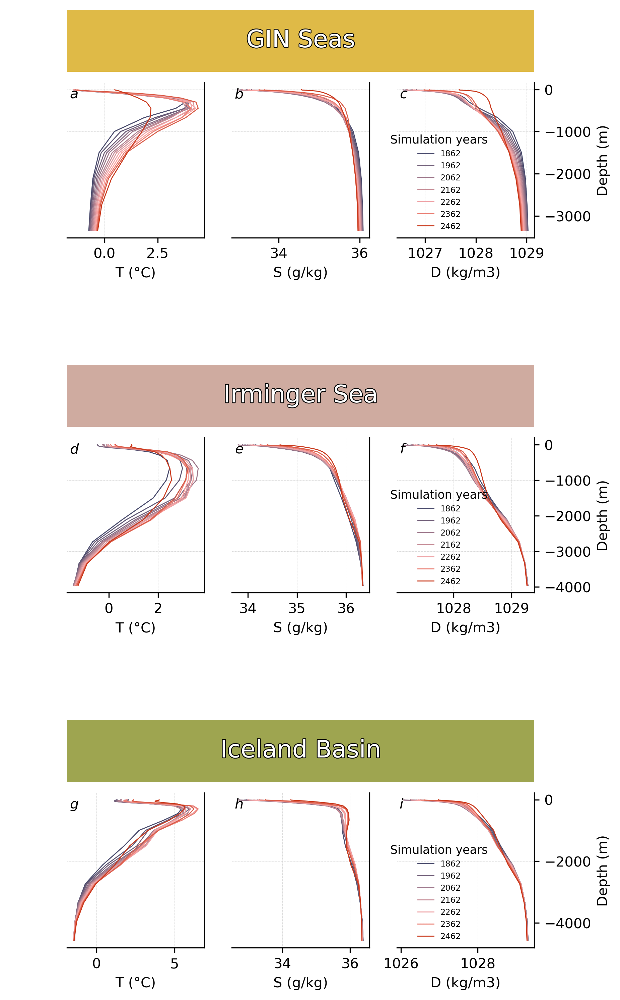

In [65]:
fig = plt.figure(figsize=(6, 10), dpi=300)

figHM = fig.subfigures(3, 1,  wspace=0.1, facecolor='None')

grid_zone = {}
axZone, axHMT, axHMS, axHMD = {}, {}, {}, {}
iterator = count(0)
for zone in ['gin', 'irm', 'eur']:
    i = next(iterator)
    grid_zone[zone] = figHM[i].add_gridspec(2, 3, height_ratios=[2,5], hspace=0.1)
    
    axZone[zone] = figHM[i].add_subplot(grid_zone[zone][0,:], facecolor='None')
    axHMT[zone] = figHM[i].add_subplot(grid_zone[zone][1,0], facecolor='None')
    axHMS[zone] = figHM[i].add_subplot(grid_zone[zone][1,1], facecolor='None')
    axHMD[zone] = figHM[i].add_subplot(grid_zone[zone][1,2], facecolor='None')

    
## Hamstring plots

decades = np.arange(int(start_point[phase]), int(end_point[phase]), 50)

### Plot Hamstrings
for zone in ['gin', 'irm', 'eur']:
    c_list = iter(cmap(np.linspace(0, 1, len(decades[::]))))
    i=0
    for decade in decades:
        c = next(c_list)
        axHMT[zone].plot(ocnt.sel(zone=zone).isel(t=slice(decade, decade+10)).mean('t'),
                         -ocnt.depth_1, 
                         color=c, lw=0.7)

        axHMS[zone].plot(ocns.sel(zone=zone).isel(t=slice(decade, decade+10)).mean('t'),
                         -ocns.depth_1, 
                         color=c, lw=0.7)

        if i%2 == 0:
            axHMD[zone].plot(ocnd.sel(zone=zone).isel(t=slice(decade, decade+10)).mean('t'),
                             -ocnd.sel(zone=zone).depth_1, 
                             label=decade,
                             color=c, lw=0.7)
        else:
            axHMD[zone].plot(ocnd.sel(zone=zone).isel(t=slice(decade, decade+10)).mean('t'),
                             -ocnd.sel(zone=zone).depth_1, 
                             color=c, lw=0.7)
        i+=1
        
        
    ### Titles
    axZone[zone].get_xaxis().set_visible(False)
    axZone[zone].get_yaxis().set_visible(False)
    for loc in ['left', 'right', 'bottom', 'top']: axZone[zone].spines[loc].set_visible(False)
    axZone[zone].set_facecolor(color_zones[zone])

    txt = axZone[zone].annotate(label_zones[zone], 
                       xy=(0.5, 0.5), xycoords='axes fraction', va='center', ha='center',
                       size='xx-large', color='white')
    txt.set_path_effects([PathEffects.withStroke(linewidth=1.2, foreground='black')])

    
# Hamstring parameters
    
for ax in axHMT, axHMS, axHMD:
    for zone in ['gin', 'irm', 'eur']: 
        ax[zone].grid(which='both', color='lightgrey', linestyle='--', linewidth=0.2, zorder=0)
        for loc in ['left', 'top']:ax[zone].spines[loc].set_visible(False)

for ax in axHMT, axHMS:
    for zone in ['gin', 'irm', 'eur']: 
        ax[zone].tick_params(axis='y', colors='None', which='both')

for zone in ['gin', 'irm', 'eur']: 
    
    axHMT[zone].set_xlabel("T (°C)")
    axHMS[zone].set_xlabel("S (g/kg)")
    axHMD[zone].set_xlabel("D (kg/m3)")
    
    axHMD[zone].yaxis.set(ticks_position='right', label_position='right')
    axHMD[zone].set_ylabel("Depth (m)")
    axHMD[zone].legend(fontsize='xx-small', loc='lower left', frameon=False,
              title='Simulation years', title_fontsize='small', bbox_to_anchor=(-0.1,0))


# Annotations

## Labels
i = count(0)
for zone in ['gin', 'irm', 'eur']:
    axHMT[zone].annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                     size=10, style='italic')
    axHMS[zone].annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                     size=10, style='italic')
    axHMD[zone].annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                     size=10, style='italic')



In [66]:
# fig.savefig(f"{output_folder}/si/strat_cooling.png", bbox_extra_artists=(), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/strat_cooling.pdf", bbox_extra_artists=(), bbox_inches='tight', format='pdf')

## Figure S16 - Antarctica bottom waters index

In [67]:
expt = 'xoupk'

In [68]:
amoc_ts = {}

for expt in ['xoupk']:
    ts = xr.open_dataset(f"{data_folder}/{expt}/{expt}.merid.annual.nc")
    amoc_ts[expt] = ts.Merid_Atlantic.sel(latitude=26.5, method='nearest').max('depth').sortby('t')
    

In [69]:
aabw = {}

for expt in ['xoupk']:
    ts = xr.open_dataset(f"{data_folder}/{expt}/{expt}.merid.annual.nc")
#     aabw[expt] = ts.Merid_Atlantic.sel(latitude=slice(-40,40)).min('depth').sortby('t')
    aabw[expt] = ts.Merid_Atlantic.sel(latitude=-33, method='nearest').min('depth').sortby('t')


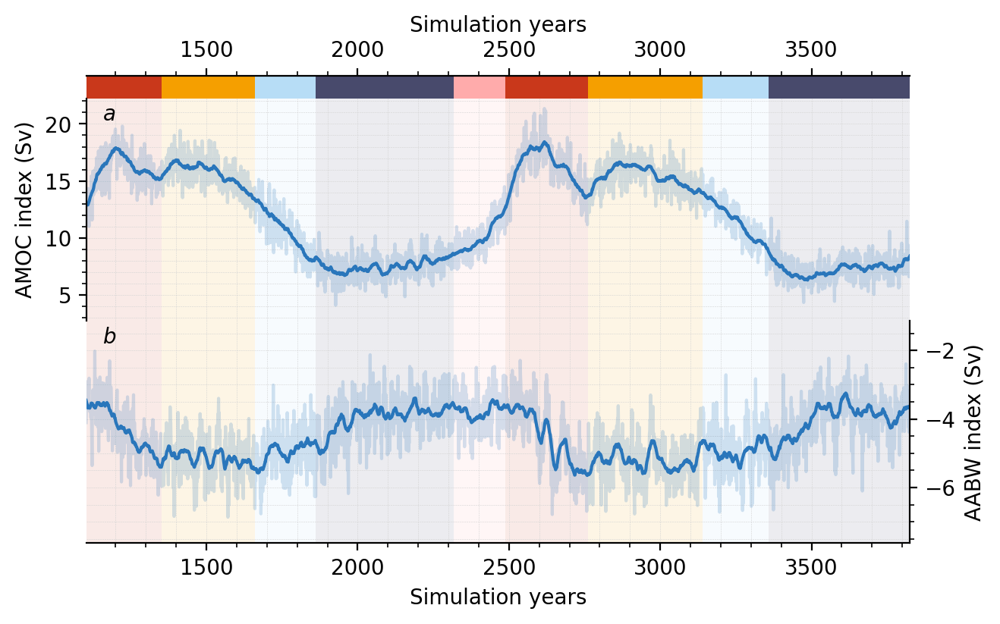

In [70]:
fig = plt.figure(figsize=(7, 4), dpi=200)

# Time series grid
gridTS = fig.add_gridspec(3, 1, hspace=0, height_ratios=[1,10, 10])
axTDC = {}

axSPAN = fig.add_subplot(gridTS[0,0], facecolor='None')
axAMOC = fig.add_subplot(gridTS[1,0], facecolor='None', sharex=axSPAN)
axAABW = fig.add_subplot(gridTS[2,0], facecolor='None', sharex=axSPAN)
axTS = [axAMOC, axAABW]

# Plot the spans
for phase in spans[expt].keys():
    for span in spans[expt][phase]:
        axSPAN.axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

for ax in axTS:
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            ax.axvspan(span[0], span[1], alpha=0.1, linewidth=0, color=color_spans[phase])

# Plot the AMOC
axAMOC.plot(amoc_ts[expt].t.dt.year-1000, amoc_ts[expt], color=color_expts[expt], alpha=0.2)
axAMOC.plot(amoc_ts[expt].t.dt.year-1000, util.rmean(amoc_ts[expt],30), color=color_expts[expt])

                
# Plot the AABW
axAABW.plot(aabw[expt].t.dt.year-1000, aabw[expt], color=color_expts[expt], alpha=0.2)
axAABW.plot(aabw[expt].t.dt.year-1000, util.rmean(aabw[expt],30), color=color_expts[expt])


for ax in axTS:
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.2)
    ax.set_xlim([spans[expt]['merid'][0][0], spans[expt]['cold'][-1][1]])

## SPAN parameters
axSPAN.set_xlabel("Simulation years")
axSPAN.xaxis.set_ticks_position('top')
axSPAN.xaxis.set_label_position('top')    
axSPAN.yaxis.set_visible(False)
axSPAN.set_ylim([0,1])
for loc in ['left', 'right', 'bottom']:axSPAN.spines[loc].set_visible(False)

            
# AMOC parameters 
axAMOC.set_ylabel("AMOC index (Sv)")
for loc in ['top', 'right', 'bottom']:axAMOC.spines[loc].set_visible(False)
axAMOC.tick_params(axis='x', colors='None', which='both')

# AABW parameters 
axAABW.set_ylabel("AABW index (Sv)")
axAABW.yaxis.set(ticks_position='right', label_position='right')
for loc in ['top', 'left']:axAABW.spines[loc].set_visible(False)
axAABW.set_xlabel("Simulation years")

i = count(0)
for ax in axTS:
    ax.annotate(alc[next(i)], xy=(0.02,0.90), xycoords='axes fraction',
                     size=10, style='italic')


In [71]:
# fig.savefig(f"{output_folder}/si/aabw.png", bbox_extra_artists=(), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/aabw.pdf", bbox_extra_artists=(), bbox_inches='tight', format='pdf')

## Figure S18 - The role of the global salinity target

In [72]:
filt = util.ButterLowPass(order=1, fc=2*10**-3, fs=1, mult=2)

In [73]:
amoc_ts = {}
amocf_ts = {}

for expt in ['tfgbi', 'xppbf']:
    ts = xr.open_dataset(f"{data_folder}/{expt}/{expt}.merid.annual.nc")
    amoc_ts[expt] = ts.Merid_Atlantic.sel(latitude=26.5, method='nearest').max('depth').sortby('t')
    amocf_ts[expt] = filt.process(amoc_ts[expt].values)
    

In [74]:
mld_zone, mldf_zone = {}, {}

for expt in  ['tfgbi', 'xppbf']:
    mld_zone[expt], mldf_zone[expt] = {}, {}
    temp_mld = xr.open_dataset(
                f"{data_folder}/{expt}/na_variables/{expt}.mld.zone_na.annual.nc").mld
    
    for zone in masks_na.keys():
        mld_zone[expt][zone] = temp_mld.sel(zone=zone)[1:]
        mldf_zone[expt][zone] = filt.process(mld_zone[expt][zone].values)

In [75]:
# Sea Ice

wice, sice = {}, {}

for expt in  ['tfgbi', 'xppbf']:

    wice[expt], sice[expt] = {}, {}
    ds_wice = xr.open_dataset(f"{data_folder}/{expt}/{expt}.iceconc.mr.nc").iceconc_mm_srf.isel(surface=0).sortby('t')
    ds_sice = xr.open_dataset(f"{data_folder}/{expt}/{expt}.iceconc.sp.nc").iceconc_mm_srf.isel(surface=0).sortby('t')

    for zone in masks_na_atm.keys():
        print(f"__Processing {zone}")
        wice[expt][zone] = (ds_wice*masks_na_atm[zone]).mean(
            dim=['longitude', 'latitude'])*100
        sice[expt][zone] = (ds_sice*masks_na_atm[zone]).mean(
            dim=['longitude', 'latitude'])*100


__Processing gin
__Processing irm
__Processing eur
__Processing ls
__Processing arc
__Processing gin
__Processing irm
__Processing eur
__Processing ls
__Processing arc


In [76]:
salinity_clusters, salinity_means = {}, {}

for expt in ['xoupa', 'tfgbi', 'xppbf']: 
    salinity_clusters[expt] = xr.open_dataset(f"{data_folder}/{expt}/salinity_budgets/{expt}.salinity_clusters.decadal.nc").salinity_cluster

for expt in ['xoupa', 'tfgbi', 'xppbf']:
    salinity_means[expt] = xr.open_dataset(f"{data_folder}/{expt}/salinity_budgets/{expt}.salinity_means.decadal.nc").salinity_means


In [77]:
ocnt, ocnd = {}, {}

for expt in ['tfgbi', 'xppbf']:
    print(f"__Processing {expt}")
    ocnt[expt] = xr.open_dataset(
        f"{data_folder}/{expt}/na_variables/{expt}.oceantemppg.zone_na.annual.nc").temp_ym_dpth.sortby('t').dropna(dim='depth_1')
    ocnd[expt] = xr.open_dataset(
        f"{data_folder}/{expt}/na_variables/{expt}.oceandenspg.zone_na.annual.nc").density.sortby('t')


__Processing tfgbi
__Processing xppbf


In [78]:
N2 = {}

for expt in  ['tfgbi', 'xppbf']:
    N2[expt] = {}
    for zone in masks_na.keys():
        N2[expt][zone] = (-9.81/1025*ocnd[expt].sel(zone=zone).sel(
            depth_1=slice(0,1000)).diff(dim='depth_1', label='lower')\
                    /ocnd[expt].sel(zone=zone).sel(
            depth_1=slice(0,1000)).depth_1.diff(dim='depth_1', label='lower')).sum('depth_1')

In [79]:
cmap_amoc = LinearSegmentedColormap.from_list('magma', matplotlib.colormaps['magma'](np.linspace(0, 0.9, 256)))
                                              
def plot_LineCollection(ax, x, y, alpha, lw, cm):
    points = np.array([x, y]).T.reshape(-1,1,2)
    segments = np.concatenate([points[:-1],points[1:]], axis=1)
    lc = LineCollection(segments, cmap=cm, linewidth=lw, alpha=alpha)
    lc.set_array(y)

    ax.add_collection(lc)
    
color_wice = 'xkcd:dark teal'
color_sice = 'xkcd:brick red'


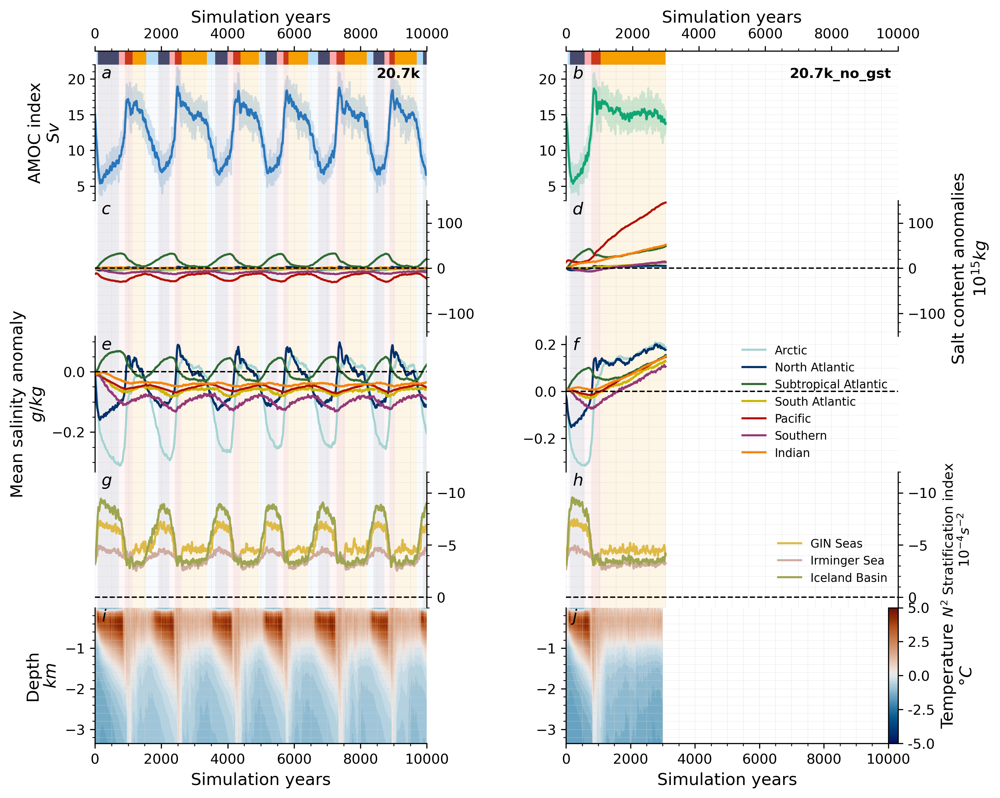

In [80]:
fig = plt.figure(figsize=(9, 9), dpi=300)

subfigs = fig.subfigures(1, 2,  wspace=0.1, facecolor='None')

axSPAN, axAMOC, axMLD, axBS, axMS, axN2, axT = {}, {}, {}, {}, {}, {}, {}
axBuffer1, axBuffer2 = {}, {}

cmapT = LinearSegmentedColormap.from_list('vik', SCM.vik(np.linspace(0, 0.95, 256)))
cmT = {}
normT = TwoSlopeNorm(vmin=-5,vcenter=0,vmax=5)

iterator = count(0)

# Grids
for expt in ['tfgbi', 'xppbf']:
    i = next(iterator)

    grid = subfigs[i].add_gridspec(6, 1, height_ratios=[1,10,10,10,10,10], hspace=0)
    
    axSPAN[expt] = subfigs[i].add_subplot(grid[0])
    axAMOC[expt] = subfigs[i].add_subplot(grid[1], sharex=axSPAN[expt], facecolor='None')
    axBS[expt] = subfigs[i].add_subplot(grid[2], sharex=axSPAN[expt], facecolor='None')
    axMS[expt] = subfigs[i].add_subplot(grid[3], sharex=axSPAN[expt], facecolor='None')
    axN2[expt] = subfigs[i].add_subplot(grid[4], sharex=axSPAN[expt], facecolor='None')
    axT[expt] = subfigs[i].add_subplot(grid[5], sharex=axSPAN[expt])

for expt in ['xppbf']:axN2[expt].sharey(axN2['tfgbi'])
for expt in ['xppbf']:axT[expt].sharey(axT['tfgbi'])

axTS = np.array([list(axAMOC.values()), list(axBS.values()), list(axMS.values()), list(axN2.values()), list(axT.values())]).flat


# Plots
for expt in ['tfgbi', 'xppbf']:

    ## Plots spans
    for phase in spans[expt].keys():
        for span in spans[expt][phase]:
            axSPAN[expt].axvspan(span[0], span[1], alpha=1, linewidth=0, color=color_spans[phase])

    for ax in axAMOC[expt], axBS[expt], axMS[expt], axN2[expt]:
        for phase in spans[expt].keys():
            for span in spans[expt][phase]:
                ax.axvspan(span[0], span[1], alpha=0.1, linewidth=0, color=color_spans[phase])

    ## Plot AMOC
    axAMOC[expt].plot(amoc_ts[expt].t.dt.year-1000, util.rmean(amoc_ts[expt],30), color=color_expts[expt])
    axAMOC[expt].plot(amoc_ts[expt].t.dt.year-1000, amoc_ts[expt], color=color_expts[expt], alpha=0.2)
    

    ## Plot salinity clusters
    for zone in masks.keys():
        axBS[expt].plot(salinity_clusters[expt].sel(zone=zone).sel(depth='tot').t.dt.year - 1000,
                 (salinity_clusters[expt].sel(zone=zone).sel(depth='tot') - 
                 np.mean(salinity_clusters['xoupa'].sel(zone=zone).sel(depth='tot').values))*1e-15, 
                  color=color_zones[zone], label=label_zones[zone])

    ## Plot salinity means
    for zone in masks.keys():
        axMS[expt].plot(salinity_means[expt].sel(zone=zone).sel(depth='tot').t.dt.year - 1000,
                 (salinity_means[expt].sel(zone=zone).sel(depth='tot') - 
                 np.mean(salinity_means['xoupa'].sel(zone=zone).sel(depth='tot').values)), 
                  color=color_zones[zone], label=label_zones[zone])


    ## Plot N2 index
    for zone in ['gin', 'irm', 'eur']:
        axN2[expt].plot(N2[expt][zone].t.dt.year-1000, util.rmean(N2[expt][zone],30)*1e4, 
                        color=color_zones[zone], label=label_zones[zone])
        
    ## Plot Subsurface warming
    zone='gin'
    cmT[expt] = axT[expt].contourf(ocnt[expt].sel(zone=zone).t.dt.year-1000, -ocnt[expt].sel(zone=zone).depth_1/1000,
                        ocnt[expt].sel(zone=zone).transpose(), cmap=cmapT, norm=normT, levels=25, zorder=1)    
    
# Parameters

## General paramters
for ax in axTS:
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.grid(which = "both", color='lightgrey', linestyle='--', linewidth=0.2, zorder=0)


## Span parameters
for ax in axSPAN.values():
    ax.xaxis.set_ticks_position('top')
    ax.xaxis.set_label_position('top')    
    ax.yaxis.set_visible(False)
    for loc in ['left', 'right', 'bottom']:ax.spines[loc].set_visible(False)
    ax.set_xlim([0,10000])
    ax.set_xlabel("Simulation years", fontsize='large')

## AMOC parameters
for ax in axAMOC.values():
    ax.tick_params(axis='x', colors='None', which='both')
    for loc in ['top', 'bottom', 'right']:ax.spines[loc].set_visible(False)
    ax.yaxis.set(ticks_position='left', label_position='left')
    ax.set_ylim([3,22])
axAMOC['tfgbi'].set_ylabel("AMOC index\n""$Sv$", fontsize='large')

## Salinity paramters
for ax in axBS.values():
    ax.tick_params(axis='x', colors='None', which='both')
    for loc in ['top', 'bottom', 'left']:ax.spines[loc].set_visible(False)
    ax.yaxis.set(ticks_position='right', label_position='right')
    ax.axhline(0, color='black', lw=1, linestyle='--')
    ax.set_ylim([-150,150])

axBS['xppbf'].set_ylabel("Salt content anomalies\n"r"$10^{15}kg$", fontsize='large')

for ax in axMS.values():
    ax.tick_params(axis='x', colors='None', which='both')
    for loc in ['top', 'bottom', 'right']:ax.spines[loc].set_visible(False)
    ax.axhline(0, color='black', lw=1, linestyle='--')

axMS['tfgbi'].set_ylabel(f"Mean salinity anomaly\n"r"$g/kg$", fontsize='large')
axMS['xppbf'].legend(loc='lower right', fontsize='small', bbox_to_anchor=(1, 0.02), frameon=False)    


## N2 paramters
for ax in axN2.values():
    ax.tick_params(axis='x', colors='None', which='both')
    ax.axhline(0, color='black', lw=1, linestyle='--')
    for loc in ['top','left','bottom']:ax.spines[loc].set_visible(False)
    ax.yaxis.set(ticks_position='right', label_position='right')
    ax.set_ylim([1,-12])
    
axN2['xppbf'].set_ylabel(r"$N^2$ Stratification index""\n"r"$10^{-4}s^{-2}$", fontsize='medium')
axN2['xppbf'].legend(loc='lower right', fontsize='small', bbox_to_anchor=(1, 0.1), frameon=False)    


# Hovmoller colorabars
fmt = lambda x, pos: '{:.1f}'.format(x)

cb = plt.colorbar(mappable=matplotlib.cm.ScalarMappable(cmap=cmapT, norm=normT), cax=make_axes_locatable(axT['xppbf']).append_axes(
    "right", size="3%", pad=0), format=FuncFormatter(fmt)).set_label("Temperature\n"r"$°C$", fontsize='large')

# Hovmoller parameter
for ax in axT.values(): 
    ax.set_xlabel("Simulation years", fontsize='large')
    for loc in ['top','right']:ax.spines[loc].set_visible(False)
    # ax.set_ylim([-4,0])


axT['tfgbi'].set_ylabel("Depth\n"r"$km$", fontsize='large')


# Annotations

## Experiment names
for expt in axAMOC.keys():
    txt = axAMOC[expt].annotate(f"{label_expts[expt]}", xy=(0.98, 0.98),
                                xycoords='axes fraction',
                                size='medium', va='top', ha='right', color='black', 
                                weight='bold')

## Labels
i = count(0)
for ax in np.array([list(axAMOC.values()), list(axBS.values()), list(axMS.values()), list(axN2.values()), list(axT.values())]).flat:
    label = alc[next(i)]
    ax.annotate(label, xy=(0.02,0.9), xycoords='axes fraction',
                         size=12, style='italic')


In [81]:
# fig.savefig(f"{output_folder}/si/comparison_nogst.png", bbox_extra_artists=(), bbox_inches='tight', format='png')
# fig.savefig(f"{output_folder}/si/comparison_nogst.pdf", bbox_extra_artists=(), bbox_inches='tight', format='pdf')

## Extra script - Calculating  spans

This script introduces the code used for calculting the phase spans. In case you want to try a different span, replace the phase definition by this code with the inputs of your choice at the start of the notebooks.

In [82]:
filt = util.ButterLowPass(order=1, fc=2*10**-3, fs=1, mult=2)

In [83]:
amoc_ts = {}
amocf_ts = {}

for expt in ['xoupk', 'tfgbi', 'xouph', 'xoupf', 'xppbf']:
    ts = xr.open_dataset(f"{data_folder}/{expt}/{expt}.merid.annual.nc")
    amoc_ts[expt] = ts.Merid_Atlantic.sel(latitude=26.5, method='nearest').max('depth').sortby('t')
    amocf_ts[expt] = filt.process(amoc_ts[expt].values)
    

In [84]:
mld = {}
mld_gin, mld_irm = {}, {}
mldf_gin, mldf_irm = {}, {}

for expt in ['xoupk', 'tfgbi', 'xouph', 'xoupf', 'xppbf']:

    ts = xr.open_dataset(f"{data_folder}/{expt}/{expt}.oceanmixedpf.annual.nc").mixLyrDpth_mm_uo
    if 'unspecified' in ts.dims:
        ts = ts.isel(unspecified=0, drop=True)[1:]
    else:
        ts = ts[1:]
        
    mld_gin[expt] = (ts*masks_na['gin']).mean(['longitude','latitude'])
    mld_irm[expt] = (ts*masks_na['irm']).mean(['longitude','latitude'])
    mldf_gin[expt] = filt.process(mld_gin[expt].values)
    mldf_irm[expt] = filt.process(mld_irm[expt].values)


In [85]:
span_regions = {}

span_regions['tfgbi']={'cold':Polygon([(18,30), (27,30), (27,40), (18,40)]), 
                       'merid':Polygon([(70,50), (95,50), (95,90), (75,90), (55,65)]), 
                       'zonal':Polygon([(30,65), (55,65), (75,90), (55,105), (30,105)]),
                       'warming':Polygon([(18,40), (27,40), (70,50), (55,65)]), 
                       'cooling':Polygon([(18,40), (27,40), (55,65), (30,65)])}

span_regions['xppbf']={'cold':Polygon([(18,30), (27,30), (27,40), (18,40)]), 
                       'merid':Polygon([(70,50), (100,50), (100,90), (75,90), (55,65)]), 
                       'zonal':Polygon([(30,65), (55,65), (75,90), (55,105), (30,105)]),
                       'warming':Polygon([(18,40), (27,40), (70,50), (55,65)]), 
                       'cooling':Polygon([(18,40), (27,40), (55,65), (30,65)])}

span_regions['xoupk']={'cold':Polygon([(18,30), (27,30), (27,40), (18,40)]), 
                       'merid':Polygon([(70,50), (100,50), (100,90), (75,90), (55,60)]), 
                       'zonal':Polygon([(30,65), (55,60), (75,90), (55,105), (30,105)]),
                       'warming':Polygon([(18,40), (27,40), (70,50), (55,60)]), 
                       'cooling':Polygon([(18,40), (27,40), (55,60), (30,65)])}

span_regions['xouph']={'cold':box(35,40,45,55), 
                       'warming':box(35,55,52,67), 
                       'merid':box(0,0,0,0), 
                       'zonal':box(35,67,52,95),
                       'cooling':box(35,55,52,67)}

span_regions['xoupf']={'cold':box(10,25,25,55), 
                       'warming':box(25,30,45,55), 
                       'merid':box(45,30,95,55), 
                       'zonal':box(0,0,0,0), 
                       'cooling':box(25,30,45,55)}


In [86]:
spans_conditions = {}

for expt in ['tfgbi', 'xoupf', 'xouph', 'xoupk', 'xppbf']:
    
    spans_conditions[expt] = {}
    damocf_ts = np.diff(util.rmean(amocf_ts[expt], 100))
    
    for phase in span_regions[expt].keys():
        
        if phase=='warming':
            spans_conditions[expt][phase] = [ \
                span_regions[expt][phase].contains(Point(mldf_gin[expt][i], mldf_irm[expt][i])) and
                damocf_ts[i]>0
                                       for i in range(len(amocf_ts[expt])-1)]
        elif phase=='cooling':
            spans_conditions[expt][phase] = [ \
                span_regions[expt][phase].contains(Point(mldf_gin[expt][i], mldf_irm[expt][i])) and
                damocf_ts[i]<0
                                       for i in range(len(amocf_ts[expt])-1)]
        else:
            spans_conditions[expt][phase] = [span_regions[expt][phase].contains(
                Point(mldf_gin[expt][i], mldf_irm[expt][i]))
                                       for i in range(len(amocf_ts[expt])-1)]
        
        spans_conditions[expt][phase][:50] = [False]*50
        spans_conditions[expt][phase].append(False)
        
        
# Because the shorter time series prevent to accurately capture the oscillating filltered time series,
# we crop the result of TFGBI to calculate the phase of XOUPK
# spans_conditions['xoupk'] = {}
# for phase in span_regions['xoupk'].keys(): 
#     spans_conditions['xoupk'][phase] = spans_conditions['tfgbi'][phase][:4000]


In [87]:
spans = {}

for expt in spans_conditions.keys():
    spans[expt] = {}
    
    for phase in spans_conditions[expt].keys():
        span_stack = []
        for i in range(1,len(spans_conditions[expt][phase])):
            if spans_conditions[expt][phase][i]!=spans_conditions[expt][phase][i-1]:
                span_stack.append(i)
        if len(span_stack)!=0:
            spans[expt][phase] = [(span_stack[2*i],span_stack[2*i+1]) for i in range(len(span_stack)//2)]
        else:
            spans[expt][phase] = [(0,0)]

In [88]:
spans['xoupf']['zonal']

[(0, 0)]

You can then save the spans by uncommenting and running the following code

In [89]:
# for expt in ['tfgbi', 'xoupf', 'xouph', 'xoupk', 'xppbf']:
#     for phase in ['cold', 'warming', 'merid', 'zonal', 'cooling']:
#         np.savetxt(f"{data_folder}/{expt}/spans/{expt}.span_conditions.{phase}.csv", span_conditions[expt][phase], delimiter=",")
#         np.savetxt(f"{data_folder}/{expt}/spans/{expt}.spans.{phase}.csv", spans[expt][phase], delimiter=",")
        

And open the spans with the following code:

In [90]:
span_conditions_csv, spans_csv = {}, {}

for expt in ['tfgbi', 'xoupf', 'xouph', 'xoupk', 'xppbf']:
    span_conditions_csv[expt], spans_csv[expt] = {}, {}

    for phase in ['cold', 'warming', 'merid', 'zonal', 'cooling']:
        span_conditions_csv[expt][phase] = np.genfromtxt(f"{data_folder}/{expt}/spans/{expt}.span_conditions.{phase}.csv", delimiter=',')

        spans_csv[expt][phase] = np.atleast_2d(
            np.genfromtxt(f"{data_folder}/{expt}/spans/{expt}.spans.{phase}.csv", delimiter=','))
        